In [2]:
import jax
import jax.numpy as jnp
from jax import grad, jit, vmap
from jax import random
from jax.experimental import optimizers
import matplotlib.pyplot as plt
import matplotlib.patches as pat
from functools import partial
from jax.config import config
import jax.lax as lax

from functools import partial

import itertools
from itertools import starmap
from jax.tree_util import tree_flatten, tree_unflatten

import numpy as np
import pickle
import copy
import pandas as pd

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import colorsys

from tqdm import tqdm
import time

config.update("jax_enable_x64", True)
config.update("jax_debug_nans", True)
config.parse_flags_with_absl()


%matplotlib inline
plt.rcParams["font.size"] = 18

# Functions

## main

In [3]:
@jit
def calc_ham_k(k_ij, t_d, from_d, to_d, arrow_d):
    ham_k = jnp.zeros((n_sub, n_sub), dtype=jnp.complex128)
    for ind, (t, i_from, i_to, dd) in enumerate(zip(t_d, from_d, to_d, arrow_d)):
        kd = t * jnp.exp(-1j*k_ij.dot(dd))
        ham_k = jax.ops.index_add(ham_k, jax.ops.index[i_to,i_from], kd) # jax does not allow direct assignment
        kd_conj = t.conj() * jnp.exp(1j*k_ij.dot(dd)) # Taking the Hermitian conjugate of a matrix causes an error when calculated in grad (resolved in later versions?)
        ham_k = jax.ops.index_add(ham_k, jax.ops.index[i_from,i_to], kd_conj) 
    return ham_k

In [4]:
@jit
def vmap_calc_ham(k, t_d, from_d, to_d, arrow_d):
    f = partial(calc_ham_k, t_d=t_d, from_d=from_d, to_d=to_d, arrow_d=arrow_d)
    return jax.vmap(jax.vmap(f))(k) # Since k is 2-dimensional, vmap twice

In [5]:
@jit
def vmap_calc_opI(k, t_d, from_d, to_d, arrow_d):
    f = partial(calc_ham_k, t_d=t_d, from_d=from_d, to_d=to_d, arrow_d=arrow_d)
    return jax.vmap(jax.vmap(jax.jacfwd(f)))(k) # Since k is 2-dimensional, vmap twice

In [6]:
@jit
def calc_sigmaxy_omegaz_k(e_k, v_k, opI_k, beta, delta, mu):
    """
    For each k-point, calculate the Hall coefficient and berry curvature
    """
    opIx_k = opI_k[:,:,0]
    opIy_k = opI_k[:,:,1]
    Ix_k = jnp.matmul(v_k.T.conj(), jnp.matmul(opIx_k, v_k))
    Iy_k = jnp.matmul(v_k.T.conj(), jnp.matmul(opIy_k, v_k))
    
    e_k = e_k.reshape(1,-1)
    omegaz_tmp1 = (1-jnp.eye(e_k.shape[1]))*Ix_k.T*Iy_k/((e_k.T - e_k)**2 + 1j*delta)
    omegaz_tmp2 = (1-jnp.eye(e_k.shape[1]))*Iy_k.T*Ix_k/((e_k.T - e_k)**2 + 1j*delta)
    omegaz = -1j*(omegaz_tmp1 - omegaz_tmp2)

    sigma_tmp1 = (fm(e_k, beta, mu) - fm(e_k.T, beta, mu))*omegaz_tmp1
    sigma_tmp2 = (fm(e_k, beta, mu) - fm(e_k.T, beta, mu))*omegaz_tmp2
    sigma_xy = -1j*(sigma_tmp1 - sigma_tmp2).sum()
    
    return sigma_xy/2*V/(2*jnp.pi), omegaz.sum(axis=0)*(V/2/jnp.pi)

In [7]:
@jit
def vmap_calc_sigmaxy_omegaz(e, v, opI, beta, delta, mu=jnp.array(0.0)):
    f = partial(calc_sigmaxy_omegaz_k, beta=beta, delta=delta, mu=mu)
    return jax.vmap(jax.vmap(f))(e, v, opI) # Since k is 2-dimensional, vmap twice

In [8]:
@jit
def fm(e, beta, mu=jnp.array(0.0)):
    return 1.0/(1.0+jnp.exp((e-mu)*beta))

In [9]:
@jit
def calc_target_mu(e, beta, filling):
    mu_max_pre = jnp.max(e)
    mu_min_pre = jnp.min(e)
    mu = (mu_max_pre + mu_min_pre)/2
    for i in range(30):
        tmp_filling = fm(e, beta, mu=mu).sum()/n_k/n_k
        sign_mu = jnp.sign(tmp_filling - filling)
        
        mu_max = mu*(sign_mu+1)/2 + mu_max_pre * (-sign_mu+1)/2
        mu_min = mu_min_pre*(sign_mu+1)/2 +  mu * (-sign_mu+1)/2
        mu = (mu_max+mu_min)/2

        mu_max_pre = mu_max
        mu_min_pre = mu_min
    return mu

In [10]:
@jit
def calc_quantity(params, logbeta, k, from_d, to_d, arrow_d, delta, filling, t_cond):
    t_all = calc_t(params, t_cond)
    beta = jnp.exp(logbeta)
    H = vmap_calc_ham(k, t_all, from_d, to_d, arrow_d)
    e,v = jnp.linalg.eigh(H)
    mu = jnp.array(0.0)

    opI = vmap_calc_opI(k, t_all, from_d, to_d, arrow_d)
    sigma_xy, omegaz = vmap_calc_sigmaxy_omegaz(e,v,opI, beta, delta, mu)
    
    return t_all, e, mu, omegaz, sigma_xy

In [11]:
def flow_aux(params, logbeta, k, from_d, to_d, arrow_d, delta, filling, t_cond):
    t_all, e, mu, omegaz, sigma_xy = calc_quantity(params, logbeta, k, from_d, to_d, arrow_d, delta, filling, t_cond)
    
    return -sigma_xy.sum().real/n_k/n_k, (t_all, e, mu, omegaz.real)

In [12]:
@jit
def train(xs, params_init, k, from_d, to_d, arrow_d, delta, filling, t_cond, dic_idx_tri, dic_opt):
    func_step_size = optimizers.piecewise_constant(dic_opt['step_loops'], dic_opt['step_sizes'])
    opt_init, opt_update, get_params = optimizers.rmsprop(func_step_size, gamma=0.99)
    opt_state = opt_init(params_init)
    def one_loop(opt_state, x):
        step, logbeta = x['step'], x['logbeta']
        func_aux = partial(flow_aux, logbeta=logbeta, k=k, from_d=from_d, to_d=to_d, arrow_d=arrow_d, delta=delta, filling=filling, t_cond=t_cond)
        params = get_params(opt_state)
        values, grads = jax.value_and_grad(func_aux, argnums=0, has_aux=True)(params) # auxはvaluesに入っている
        opt_state = opt_update(step, grads, opt_state)
        intermed_states = calc_intermed_states(*values[1], jnp.exp(logbeta), dic_idx_tri)
        dict_out = {'param': get_params(opt_state), 'logbeta': logbeta, 'sigma_xy': values[0], 'grads': grads}
        dict_out.update(intermed_states)

        return opt_state, dict_out 
    state_end, logger = lax.scan(one_loop, opt_state, xs)
    return state_end, logger

## setup

In [13]:
def make_reciprocal_vec(R):
    if R.shape == (2,2):
        tmp0 = jnp.array([0.0,0.0]).reshape(2,1)
        Rz = jnp.array([0.0, 0.0, 1.0*latconst]).reshape(1,3)
        R_ex = jnp.concatenate([R, tmp0], axis=1)
        R_ex = jnp.concatenate([R_ex, Rz], axis=0)
    elif R.shape == (3,3): 
        R_ex = R
    
    denom = jnp.cross(R_ex[0], R_ex[1]).dot(R_ex[2])
    b0 = 2*jnp.pi*jnp.cross(R_ex[1], R_ex[2])/denom
    b1 = 2*jnp.pi*jnp.cross(R_ex[2], R_ex[0])/denom
    b2 = 2*jnp.pi*jnp.cross(R_ex[0], R_ex[1])/denom

    K = jnp.concatenate([b0, b1, b2]).reshape(3,3)
    
    # Multiply the reciprocal lattice by the original lattice and back to the unit matrix?
    assert jnp.allclose(jnp.matmul(K, R_ex.T)/2/jnp.pi, jnp.eye(3))
        
    if R.shape == (2,2):
        V = jnp.cross(K[0], K[1])[2]
        return K[:2, :2], V
    elif R.shape == (3,3):
        V = jnp.cross(K[0], K[1]).dot(K[2])
        return K, V

In [14]:
def get_initial(seed=1235):
    key = random.PRNGKey(seed)

    key, subkey = jax.random.split(key)
    s_all = random.uniform(key, (2,), minval=-1, maxval=1, dtype=jnp.double ) 
    key, subkey = jax.random.split(key)
    r_all = random.uniform(key, (6,), dtype=jnp.double ) 
    key, subkey = jax.random.split(key)
    p_all = random.uniform(key, (6,), minval=-jnp.pi, maxval=jnp.pi, dtype=jnp.double)
    
    params = jnp.concatenate([s_all, r_all, p_all])

    return params

In [15]:
def calc_t(params, t_cond):
    """
    Calculate the hopping separately for real and complex numbers. It also depends on whether the absolute value is fixed or not.
    """
    s_all = params[0:2]
    r_all = jnp.concatenate([jnp.array([0.0]*len(from_d1)), params[2:8]])
    p_all = jnp.concatenate([jnp.array([0.0]*len(from_d1)), params[8:14]])

    t_real = jnp.tanh(s_all).astype(jnp.complex128) * t_cond['s_max']
    r_fixed = t_cond["r_max"]
    r_modified = t_cond["r_max"] * jax.nn.sigmoid(r_all)
    r_all_tmp = jnp.where(t_cond["r_fix"], r_fixed, r_modified)
    p_fixed = t_cond["p_val"]
    p_all_tmp = jnp.where(t_cond["p_fix"], p_fixed, p_all)
    t_complex = r_all_tmp * jnp.exp(1j*p_all_tmp)
    t_all = jnp.concatenate([t_real, t_complex])
    return t_all

## logging

In [16]:
def save_results(opt_state, logger, text_condition, seed):
    t_traind = optimizers.unpack_optimizer_state(opt_state)
    filename = f'result/opt_state_{text_condition}_seed{seed}.pkl'
    with open(filename, 'wb') as file:
        pickle.dump(t_traind, file)

    filename = f'result/logger_{text_condition}_seed{seed}.pkl'
    with open(filename, 'wb') as file:
        pickle.dump(logger, file)
    print(f'if you want to load this: \nopt_state, logger = load_results(\'{text_condition}\',{seed}) \nparams = get_params(opt_state)')
    
def load_results(text_condition, seed):
    filename = f'result/opt_state_{text_condition}_seed{seed}.pkl'
    with open(filename, 'rb') as file:
        t_traind = pickle.load(file)
    opt_state = optimizers.pack_optimizer_state(t_traind)

    filename = f'result/logger_{text_condition}_seed{seed}.pkl'
    with open(filename, 'rb') as file:
        logger = pickle.load(file)

    return opt_state, logger

In [17]:
def calc_gaps(e):
    gaps = jax.nn.relu(jnp.min(e, axis=(0,1))[1:] - jnp.max(e, axis=(0,1))[:-1])
    
    e_diff = e[:,:,1:] - e[:,:,:-1]
    gaps_direct = jnp.min(e_diff, axis=(0,1))
    return gaps, gaps_direct

In [18]:
def calc_intermed_states(t_all, e, mu, omegaz_real, beta, dic_idx_tri):
    N_k = jnp.array(e.shape[:-1]).prod()
    gaps, gaps_direct = calc_gaps(e)
    n_fm_e = dfm_de(e, beta, mu)
    n_fm = n_fm_e.sum()/N_k
    bc_fm_posi = (jax.nn.relu(n_fm_e*omegaz_real)).sum()/N_k
    bc_fm_nega = (jax.nn.relu(-n_fm_e*omegaz_real)).sum()/N_k
    
    bc_fm_above = (omegaz_real * fm(e,beta,mu) * jnp.heaviside(e-mu, 0.5)).sum()/N_k
    bc_fm_below = (omegaz_real * fm(e,beta,mu) * jnp.heaviside(-(e-mu), 0.5)).sum()/N_k

    chern_num = omegaz_real.sum(axis=(0,1))/N_k
    dic_phase = {}
    
    omegaz_real_max = jnp.max(omegaz_real)
    omegaz_real_min = jnp.min(omegaz_real)
    
    n_fill = fm(e, beta, mu).sum()/N_k
    e_tot = (fm(e, beta, mu)*e).sum()/N_k

    return {'mu': mu, 'e_tot': e_tot, 'n_fill': n_fill, 'gaps': gaps, 'gaps_direct': gaps_direct, 'n_fm': n_fm, 
            'bc_fm_posi': bc_fm_posi, 'bc_fm_nega': bc_fm_nega, 'bc_fm_above':bc_fm_above, 'bc_fm_below': bc_fm_below, 
            'chern_num': chern_num, 'omegaz_real_max': omegaz_real_max, 'omegaz_real_min': omegaz_real_min} | dic_phase

In [19]:
def calc_berry_connection(k, v, beta, delta, t_res, from_d, to_d, arrow_d):
    """
    Calculate the Berry connection from the difference in phase of the wave functions between the neighboring k points.
    see the Eq. (10) in https://journals.jps.jp/doi/10.1143/JPSJ.74.1674 
    """
    delta_kx = jnp.array([(K/k.shape[0]).sum(axis=0)[0], 0.0])
    delta_ky = jnp.array([0.0, (K/k.shape[1]).sum(axis=0)[1]])
    
    H_x1 = vmap_calc_ham(k + delta_kx, t_res, from_d, to_d, arrow_d)
    _e, v_x1 = jnp.linalg.eigh(H_x1)
    
    H_y1 = vmap_calc_ham(k + delta_ky, t_res, from_d, to_d, arrow_d)
    _e, v_y1 = jnp.linalg.eigh(H_y1)
    
    a_x = jnp.matmul(v_x1.transpose(0,1,3,2).conj(), v)
    a_x = a_x.diagonal(axis1=2, axis2=3)
    a_x = jnp.angle(a_x)

    a_y = jnp.matmul(v_y1.transpose(0,1,3,2).conj(), v)
    a_y = a_y.diagonal(axis1=2, axis2=3)
    a_y = jnp.angle(a_y)
    
    # The sign of the wave function calculated by jnp.linalg.eigh can be reversed between neighboring k-points, so align it to (-π/2,π/2).
    a_x = jnp.where(a_x>jnp.pi/2, a_x-jnp.pi, a_x)
    a_x = jnp.where(a_x<-jnp.pi/2, a_x+jnp.pi, a_x)
    a_y = jnp.where(a_y>jnp.pi/2, a_y-jnp.pi, a_y)
    a_y = jnp.where(a_y<-jnp.pi/2, a_y+jnp.pi, a_y)
    
    return a_x, a_y

In [20]:
@jit
def dfm_de(e, beta, mu=jnp.array(0.0)):
    return beta*jnp.exp(beta*(e-mu))/(1.0+jnp.exp((e-mu)*beta))**2

In [21]:
def cat_logger(logger1, logger2):
    logger2_copy = copy.copy(logger2)
    if logger1 == {}:
        return logger2_copy
    else:
        logger1_flat, logger1_tree = tree_flatten(logger1)
        logger2_flat, logger2_tree = tree_flatten(logger2)
        logger_new_flat = list(starmap(lambda v1, v2: jnp.concatenate([v1, v2]), zip(logger1_flat, logger2_flat)))
        logger_new = tree_unflatten(logger1_tree, logger_new_flat)
        
        return logger_new

In [22]:
@jit
def calc_result(beta, delta, params, k, from_d, to_d, arrow_d, t_cond, filling=None):
    """
    Calculate physical quantities from optimized parameters.
    """
    t_res = calc_t(params,t_cond)
    H = vmap_calc_ham(k, t_res, from_d, to_d, arrow_d)
    e,v = jnp.linalg.eigh(H)
    opI = vmap_calc_opI(k, t_res, from_d, to_d, arrow_d)
    if filling is not None:
        mu = calc_target_mu(e, beta, filling)
    else:
        mu = jnp.array(0.0)
    sigma_xy, omegaz = vmap_calc_sigmaxy_omegaz(e,v,opI, beta, delta, mu)

    chern_num = omegaz.sum(axis=(0,1)).real/n_k/n_k
    n_fill = fm(e, beta, mu).sum()/n_k/n_k
    
    a_x, a_y = calc_berry_connection(k, v, beta, delta, t_res, from_d, to_d, arrow_d)
    
    if filling is not None:
        return e, v, sigma_xy, chern_num, n_fill, mu, omegaz, a_x, a_y
    else:
        return e, v, sigma_xy, chern_num, n_fill, omegaz, a_x, a_y

## plot

In [23]:
def plot_berrycurvature(k, omegaz, chern_num, vminmax=20, a_x=None, a_y=None):
    fig = plt.figure(figsize=(24, 18))
    for n_band in range(len(chern_num)):
        ax = fig.add_subplot(2,2,n_band+1)
        im = ax.pcolor(k[:,:,0], k[:,:,1], omegaz[:,:,n_band].real, vmin=-vminmax, vmax=vminmax, cmap='coolwarm', shading='auto')
        fig.colorbar(im, ax=ax)
        if a_x != None and a_y != None:
            ax.quiver(k[:,:,0], k[:,:,1], a_x[:,:,n_band], a_y[:,:,n_band])
        ax.set_title(f'{n_band+1} chern:{chern_num[n_band]}')
    plt.show()

In [24]:
def plot_t(t_res):
    fig, axs = plt.subplots(1, 3, sharex=True, figsize=(18,6))

    R_expand = jnp.array([[0,0],[1,0],[0,1],[1,-1],[-1,1],[-1,0],[0,-1],[1,1],[-1,-1]]).dot(R)

    l_len_sub = [len(from_d1), len(from_d2)]
    i_e = len(from_d0)
    print(f't0: {t_res[:2].real - mu}')
    for iii, len_sub  in enumerate(l_len_sub):

        ax = axs[iii]
        for sub_i in sub:
            sub_expand = sub_i+R_expand
            ax.scatter(sub_expand[:,0], sub_expand[:,1], c='black')

        i_s = i_e
        i_e = i_s + len_sub
        for fd_i, td_i, ad_i, t_i in zip(from_d[i_s:i_e], to_d[i_s:i_e], arrow_d[i_s:i_e], t_res[i_s:i_e]):
            t_i_abs = jnp.abs(t_i)
            t_i_phase = jnp.angle(t_i)/jnp.pi*0.5+0.5 # [0,1]
            ax.annotate("", xy=sub[fd_i]+ad_i, xytext=sub[fd_i],arrowprops=dict(arrowstyle="->",
                            color=[*colorsys.hsv_to_rgb(t_i_phase.item(), 1.0, 1.0)],lw=t_i_abs*5,alpha=0.5))
        def s_wid(sub_i):
            s_mean = sub.mean(axis=0)
            wid = 0.3
            return sub_i+wid*(sub_i-s_mean)
        for R_i in R_expand:
            p = pat.Polygon(xy = [s_wid(sub[0])+R_i,s_wid(sub[2])+R_i,s_wid(sub[3])+R_i,s_wid(sub[1])+R_i ], fc = "gray", alpha=0.3) #, ec = "black"
            ax.add_patch(p)
        ax.set_xlim(-3.2,4.2)
        ax.set_ylim(-3.2,4.2)
    plt.show()

In [25]:
def plot_band(k,e):
    fig = plt.figure(figsize=(16, 6))
    ax = fig.add_subplot(121)
    cs = ax.contourf(k[:,:,0], k[:,:,1], e[:,:,0]-mu, levels=30, cmap="twilight")
    ax.set_title('1')
    fig.colorbar(cs, ax=ax)

    ax = fig.add_subplot(122)
    cs = ax.contourf(k[:,:,0], k[:,:,1], e[:,:,1]-mu, levels=30, cmap="twilight")
    ax.set_title('2')
    fig.colorbar(cs, ax=ax)
    plt.show()

In [26]:
def plot_band_3d(k, e, mu):
    fig = go.Figure(data=[go.Surface(x=k[:,:,0], y=k[:,:,1], z=e[:,:,0]-mu),
                      go.Surface(x=k[:,:,0], y=k[:,:,1], z=e[:,:,1]-mu, showscale=False),
                     ])

    fig.update_layout(title='triangular lattice', autosize=False, width=500, height=500, 
                  margin=dict(l=65, r=50, b=65, t=90))
    fig.show()

In [27]:
def plot_logger(logger):
    plt.rcParams["font.size"] = 18

    fig, axes = plt.subplots(3,4, figsize=(24,15), sharex=True)
    axes[0][0].plot(logger['sigma_xy'])
    axes[0][0].set_title(r'-$\sigma_{xy}$')

    axes[0][1].plot(logger['chern_num'], label=['1','2'])
    axes[0][1].set_title('chern_num')
    axes[0][1].legend()

    axes[0][2].plot(logger['bc_fm_below'], label='below')
    axes[0][2].plot(logger['bc_fm_above'], label='above')
    axes[0][2].axhline(y=0.0, xmin=0.0, xmax=1.0, color='black')
    axes[0][2].set_title('BC above and below Fermi level')
    axes[0][2].legend()

    grads_norm = jnp.linalg.norm(logger['grads'], axis=1)
    axes[0][3].plot(grads_norm)
    axes[0][3].set_title('grads_norm')

    
    axes[1][0].plot(logger['gaps'], label=['1-2'], alpha=0.5)
    axes[1][0].axhline(y=0.0, xmin=0.0, xmax=1.0, color='black')
    axes[1][0].set_title('gap')
    axes[1][0].legend()

    
    axes[1][1].plot(logger['gaps_direct'], label=['1-2'], alpha=0.5)
    axes[1][1].axhline(y=0.0, xmin=0.0, xmax=1.0, color='black')
    axes[1][1].set_title('direct gap')
    axes[1][1].legend(loc='upper left')

    axes[1][2].plot(logger['logbeta'])
    axes[1][2].set_title('logbeta')
    
    axes[1][3].plot(logger['omegaz_real_max'], label='omegaz_real_max', alpha=0.5)
    axes[1][3].plot(logger['omegaz_real_min'], label='omegaz_real_min', alpha=0.5)
    axes[1][3].set_title('omegaz_real_max,min')

    
    
    axes[2][0].plot(logger['mu'], alpha=0.5)
    axes[2][0].set_title(r'$\mu$')
    axes[2][0].set_xlabel('loop')

    
    axes[2][1].plot(logger['e_tot'], alpha=0.5)
    axes[2][1].set_title('total energy')
    axes[2][1].set_xlabel('loop')

    axes[2][2].plot(logger['n_fill'], alpha=0.5)
    axes[2][2].set_title('filling')
    axes[2][2].set_xlabel('loop')

    axes[2][3].plot(logger['n_fm'])
    axes[2][3].set_title('n_fm')
    axes[2][3].set_xlabel('loop')

    
    plt.show()

In [28]:
def plot_logger_t(logger):
    plt.rcParams["font.size"] = 18

    fig, axes = plt.subplots(2,3, figsize=(18,12), sharex=True)

    axes[0][0].plot(logger['tri_phase']['t10']/jnp.pi)
    axes[0][0].plot(logger['tri_phase']['t11']/jnp.pi)
    axes[0][0].set_title(r'triangle $\phi$/$\pi$ t1-t1-t1')

    axes[0][1].plot(logger['tri_phase']['t20']/jnp.pi)
    axes[0][1].plot(logger['tri_phase']['t21']/jnp.pi)
    axes[0][1].set_title(r'triangle $\phi$/$\pi$ t2-t2-t2')

    axes[0][2].plot(logger['tri_phase']['t30']/jnp.pi)
    axes[0][2].plot(logger['tri_phase']['t31']/jnp.pi)
    axes[0][2].set_title(r'triangle $\phi$/$\pi$ t3-t3-t3')


    for _t in ['t1t20', 't1t21', 't1t22', 't1t23', 't1t24', 't1t25']:
        axes[1][0].plot(logger['tri_phase'][_t]/jnp.pi)
    axes[1][0].set_title(r'triangle $\phi$/$\pi$ t1-t1-t2')

    for _t in ['t1t2t30', 't1t2t31', 't1t2t310', 't1t2t311', 't1t2t32', 't1t2t33', 't1t2t34', 't1t2t35', 't1t2t36', 't1t2t37', 't1t2t38', 't1t2t39']:
        axes[1][1].plot(logger['tri_phase'][_t]/jnp.pi)
    axes[1][1].set_title(r'triangle $\phi$/$\pi$ t1-t2-t3')
    
    for _key in logger['tri_weight'].keys():    
        axes[1][2].plot(logger['tri_weight'][_key], alpha=0.3)
    axes[1][2].set_title(r'triangle weights')
    
    plt.show()

In [29]:
def plot_t_circle(t_res):
    to_marker = {0: 'o', 1: '^', 2: '*', 3: '+'}

    from_d1_marker = np.array([to_marker[i] for i in from_d1])
    angle_d1 = jnp.angle(jnp.abs(arrow_d1[:,0]) + 1j*jnp.abs(arrow_d1[:,1])* jnp.sign(arrow_d1[:,0])*jnp.sign(arrow_d1[:,1]))

    from_d2_marker = np.array([to_marker[i] for i in from_d2])
    angle_d2 = jnp.angle(jnp.abs(arrow_d2[:,0]) + 1j*jnp.abs(arrow_d2[:,1])* jnp.sign(arrow_d2[:,0])*jnp.sign(arrow_d2[:,1]))

    from_d3_marker = np.array([to_marker[i] for i in from_d3])
    angle_d3 = jnp.angle(jnp.abs(arrow_d3[:,0]) + 1j*jnp.abs(arrow_d3[:,1])* jnp.sign(arrow_d3[:,0])*jnp.sign(arrow_d3[:,1]))
    
    
    fig, axs = plt.subplots(1, 3, sharex=True, figsize=(24,6))
    ax = axs[0]
    for _x, _y, _c, _m in zip(t_res[4:16].real, t_res[4:16].imag, angle_d1, from_d1_marker):
        cs = ax.scatter(_x, _y, c=_c, cmap='rainbow', marker=_m, s=200, alpha=0.7, vmax=jnp.max(angle_d1), vmin=jnp.min(angle_d1))
    fig.colorbar(cs, ax=ax)
    ax.set_xlim(-1.1,1.1)
    ax.set_ylim(-1.1,1.1)

    ax = axs[1]
    for _x, _y, _c, _m in zip(t_res[-24:-12].real, t_res[-24:-12].imag, angle_d2, from_d2_marker):
        cs = ax.scatter(_x, _y, c=_c, cmap='rainbow', marker=_m, s=200, alpha=0.7, vmax=jnp.max(angle_d2), vmin=jnp.min(angle_d2))
    fig.colorbar(cs, ax=ax)
    ax.set_xlim(-1.1,1.1)
    ax.set_ylim(-1.1,1.1)

    ax = axs[2]

    for _x, _y, _c, _m in zip(t_res[-12:].real, t_res[-12:].imag, angle_d3, from_d3_marker):
        cs = ax.scatter(_x, _y, c=_c, cmap='rainbow', marker=_m, s=200, alpha=0.7, vmax=jnp.max(angle_d2), vmin=jnp.min(angle_d2))
    fig.colorbar(cs, ax=ax)
    ax.set_xlim(-1.1,1.1)
    ax.set_ylim(-1.1,1.1)
    
    plt.show()

In [38]:
def plot_logger_param(logger, params_init):
    fig, axs = plt.subplots(1, 3, sharex=True, figsize=(18,6))
    
    params = jnp.concatenate([params_init.reshape(1,-1), logger['param']])
    
    axs[0].plot(params[:, 0:2], alpha=0.5)
    axs[0].set_title('m')
    
    axs[1].plot(jax.nn.sigmoid(params[:, 2:8]))
    axs[1].set_title('r')
    
    cmap = plt.get_cmap("tab10") 
    tmp_phase = params[:, 8:14]* jnp.array([1,-1,1,-1,1,-1])/jnp.pi
    for i in range(tmp_phase.shape[1]):
        axs[2].plot(tmp_phase[:, i], c=cmap(i), alpha=0.5)
        axs[2].plot(tmp_phase[:, i]+2, c=cmap(i), alpha=0.5)
        axs[2].plot(tmp_phase[:, i]-2, c=cmap(i), alpha=0.5)    
        axs[2].plot(tmp_phase[:, i]+4, c=cmap(i), alpha=0.5)
        axs[2].plot(tmp_phase[:, i]-4, c=cmap(i), alpha=0.5)    
    plt.ylim(-1,1)
    axs[2].set_ylim(-1,1)
    axs[2].set_title(r'$\phi$ of $t_2$')
    
    plt.show()

# Calculation

## setup

In [30]:
latconst = 1.0

# N.N. vectors
a = latconst*jnp.array([
    [3.0**0.5/2, -0.5],
    [0.0, 1.0],
    [-3.0**0.5/2, -0.5],
])

# fundamental translational vector
R = latconst*jnp.array([
    [3.0**0.5, 0.0],
    [3.0**0.5/2, 1.5],
])


sub = jnp.array([
    [0.0,0.0],
    [0.0,1.0],
])
n_sub = sub.shape[0]

# reciprocal lattice vector
K, V = make_reciprocal_vec(R)

n_k = 100
k_1d = jnp.arange(0,1,1.0/n_k)
k1, k2 = jnp.meshgrid(k_1d,k_1d)

k = k1.reshape(n_k,n_k,1)*K[1] + k2.reshape(n_k,n_k,1)*K[0]

In [31]:
d1i = jnp.array([
    [ 1, 0],
    [ 0, 1],
    [-1, 1],
])

# hopping direction from A and B sublattice
da0 = jnp.array([[0.0, 0.0]])
da1 = a
da2 = jnp.dot(d1i, R)

db0 = jnp.array([[0.0, 0.0]])
db1 = -a
db2 = jnp.dot(d1i, R)

In [32]:
from_d0 = jnp.array([0,1])
to_d0 = jnp.array([0,1])
arrow_d0 = jnp.array([[0.0,0.0], [0.0,0.0]])

from_d1 = jnp.array([0,0,0])
to_d1 = jnp.array([1,1,1])
arrow_d1 = a

from_d2 = jnp.array([0,0,0,1,1,1])
to_d2 = jnp.array([0,0,0,1,1,1])
arrow_d2 = jnp.concatenate([da2, db2])

from_d = jnp.concatenate([from_d0, from_d1, from_d2])
to_d = jnp.concatenate([to_d0, to_d1, to_d2])
arrow_d = jnp.concatenate([arrow_d0, arrow_d1, arrow_d2])

In [34]:
# By using r_ind, only the value of a specific index can be used in common from among r_all.
t_cond = {
    "s_max": 1.0, 
    "r_max": jnp.array([1.0]*len(from_d1) + [1.0]*len(from_d2)),
    "r_fix": jnp.array([True]*len(from_d1) + [False]*len(from_d2) ), 
    "p_fix": jnp.array([True]*len(from_d1) + [False]*len(from_d2)), 
    "p_val": jnp.array([0.0]*len(from_d1) + [1.0]*len(from_d2))
}

## run with several initial conditions

In [42]:
n_k = 100
k_1d = jnp.arange(0,1,1.0/n_k)
k1, k2 = jnp.meshgrid(k_1d,k_1d)
k = k1.reshape(n_k,n_k,1)*K[1] + k2.reshape(n_k,n_k,1)*K[0]

filling = jnp.array(1.0)
delta = jnp.array(0.00001)
mu=jnp.array(0.0)

step_size = 0.1
num_steps = 100

In [40]:
_ampl, _mean, _period = 0.5, -1.5, 200
logbetas_sin = -_ampl*jnp.cos(2*jnp.pi*jnp.arange(100)/_period) + _mean
logbetas = logbetas_sin

In [41]:
dic_opt = {
    'step_loops': [50],
    'step_sizes': [0.1, 0.03]
}

0 1.0000000000209817 [ 1. -1.] 1.0
if you want to load this: 
opt_state, logger = load_results('haldane',0) 
params = get_params(opt_state)



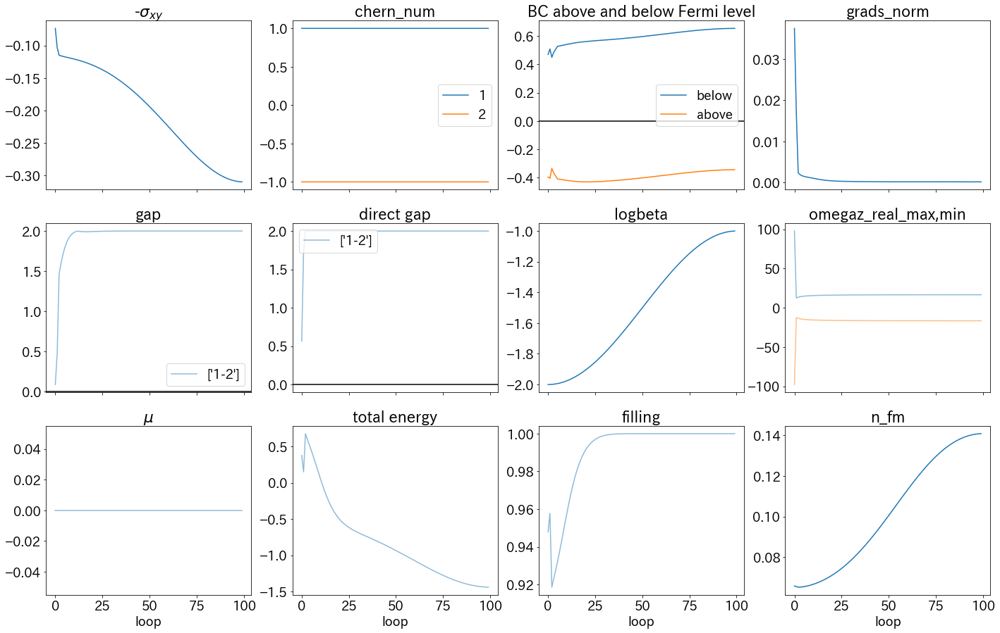

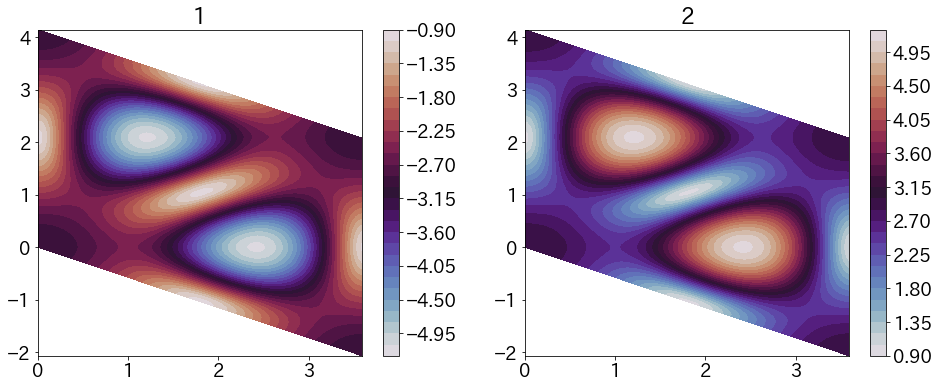

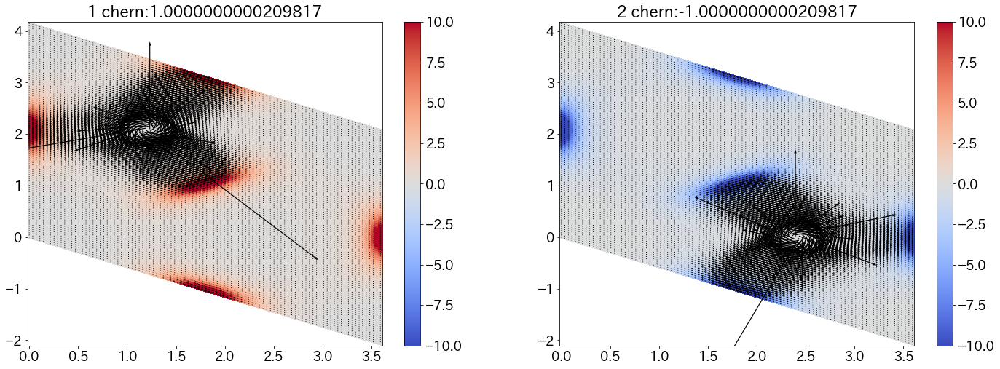

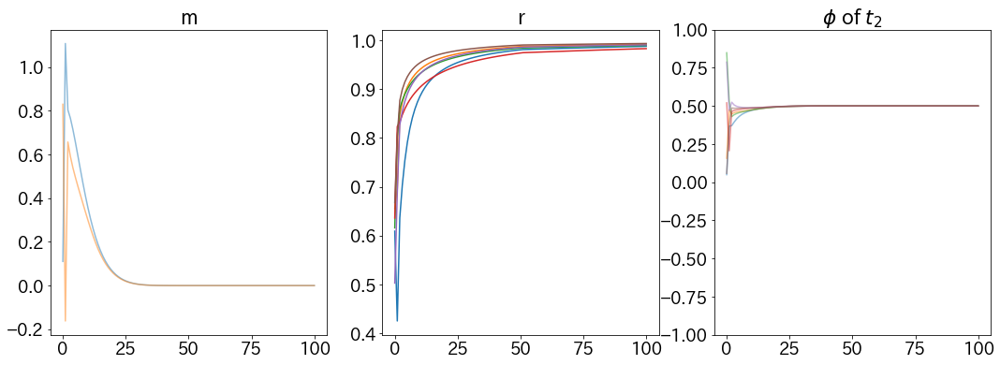

1 1.0000000000078557 [ 1. -1.] 1.0
if you want to load this: 
opt_state, logger = load_results('haldane',1) 
params = get_params(opt_state)



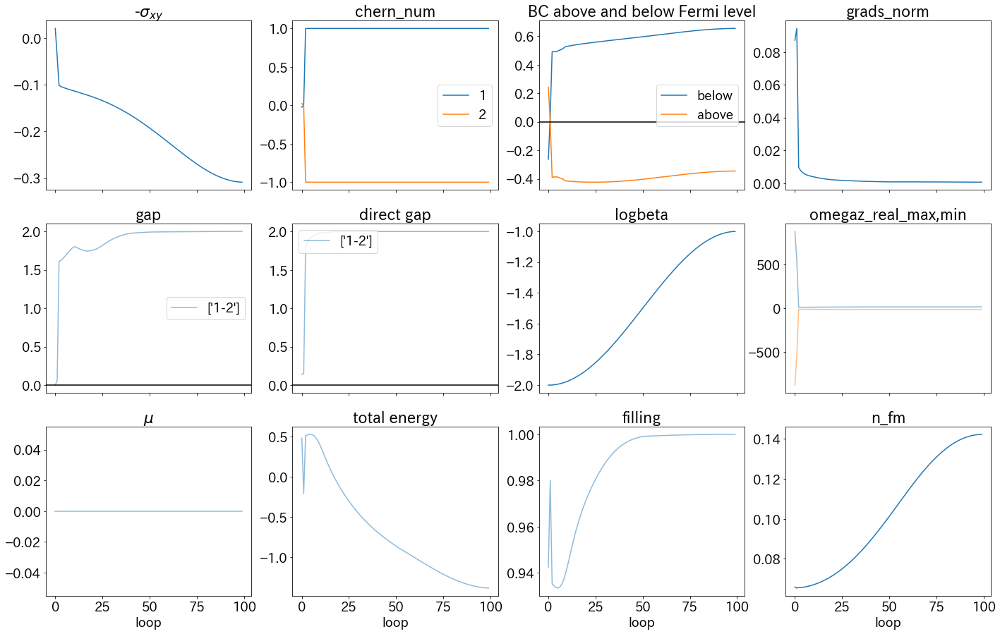

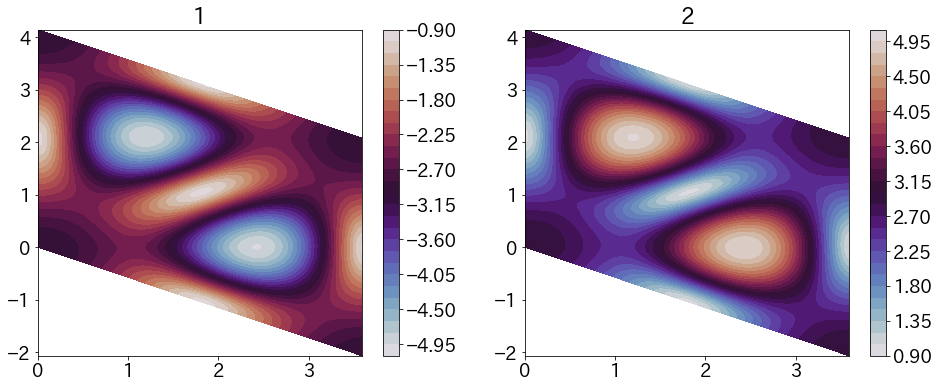

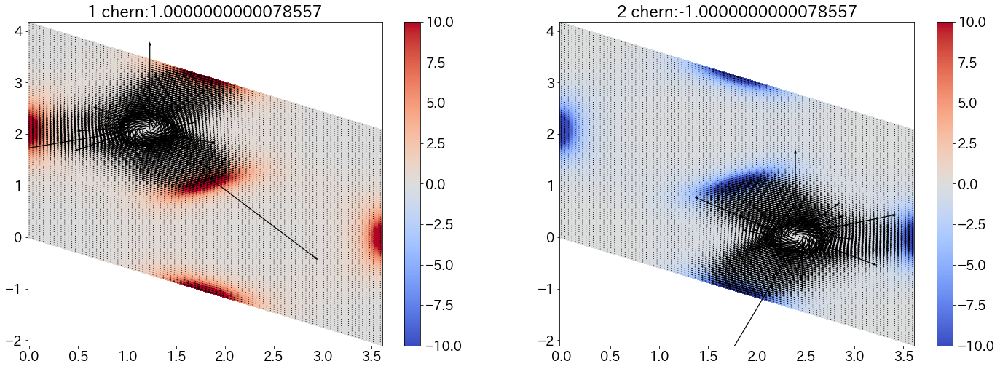

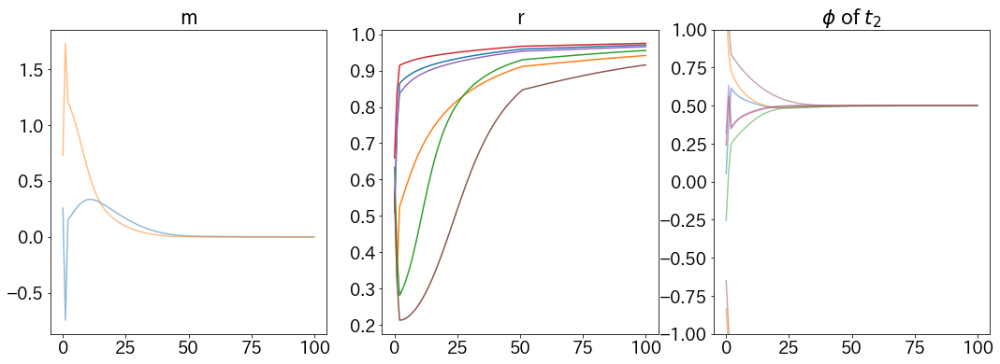

2 1.0000000000088125 [ 1. -1.] 1.0
if you want to load this: 
opt_state, logger = load_results('haldane',2) 
params = get_params(opt_state)



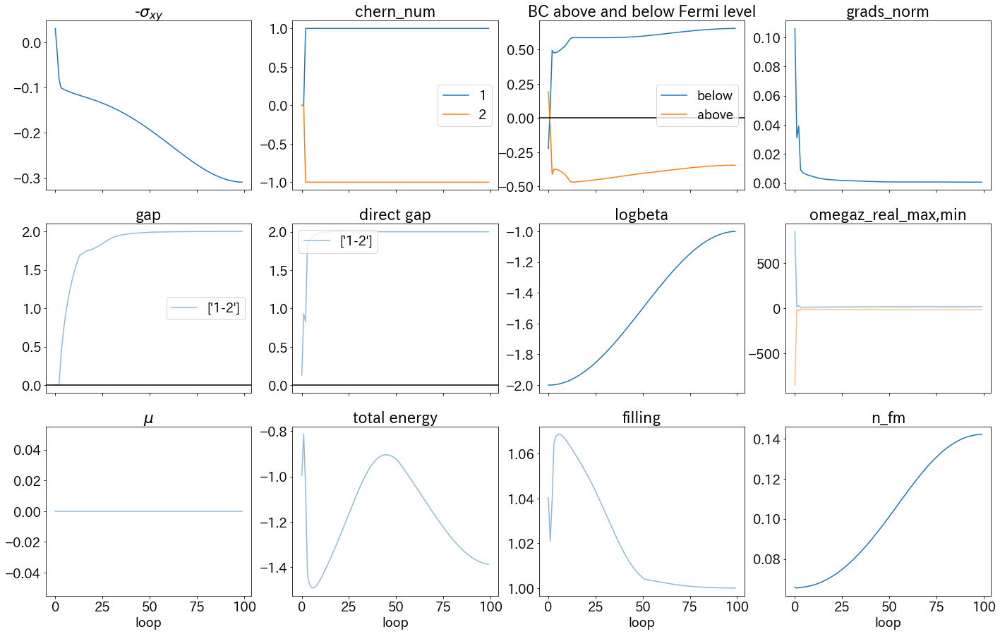

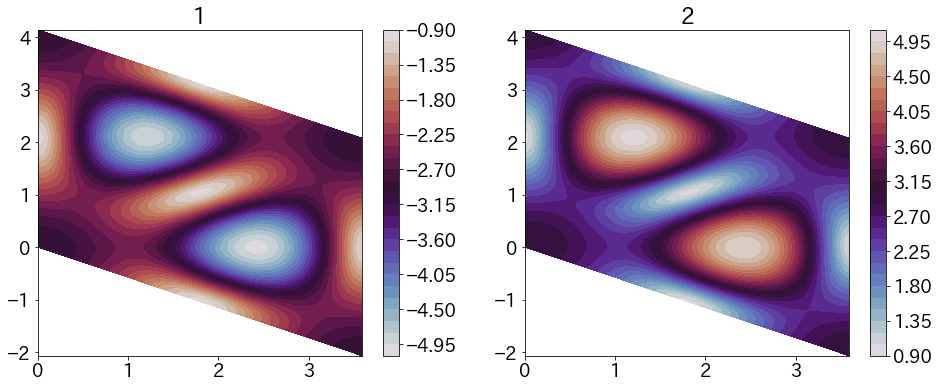

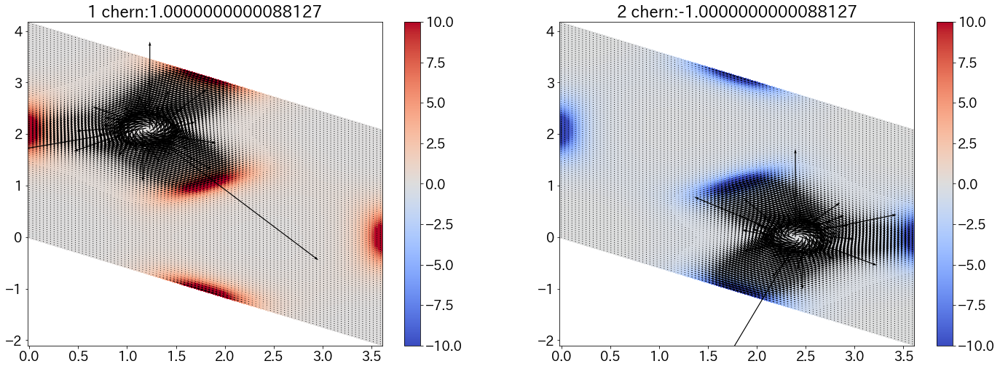

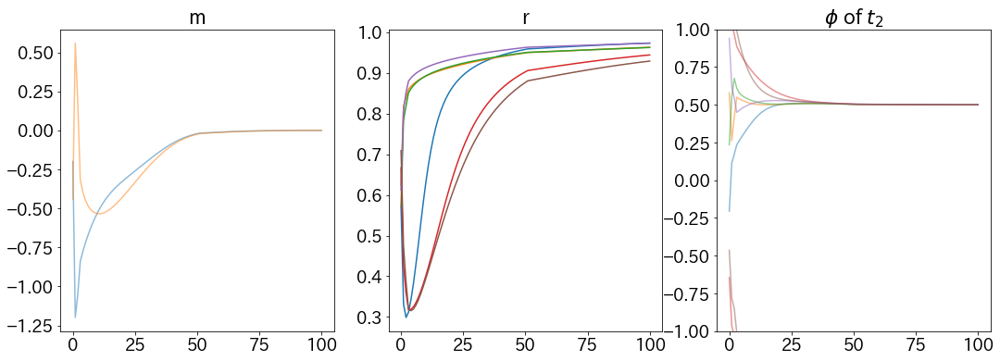

3 1.0000000000170146 [ 1. -1.] 1.0
if you want to load this: 
opt_state, logger = load_results('haldane',3) 
params = get_params(opt_state)



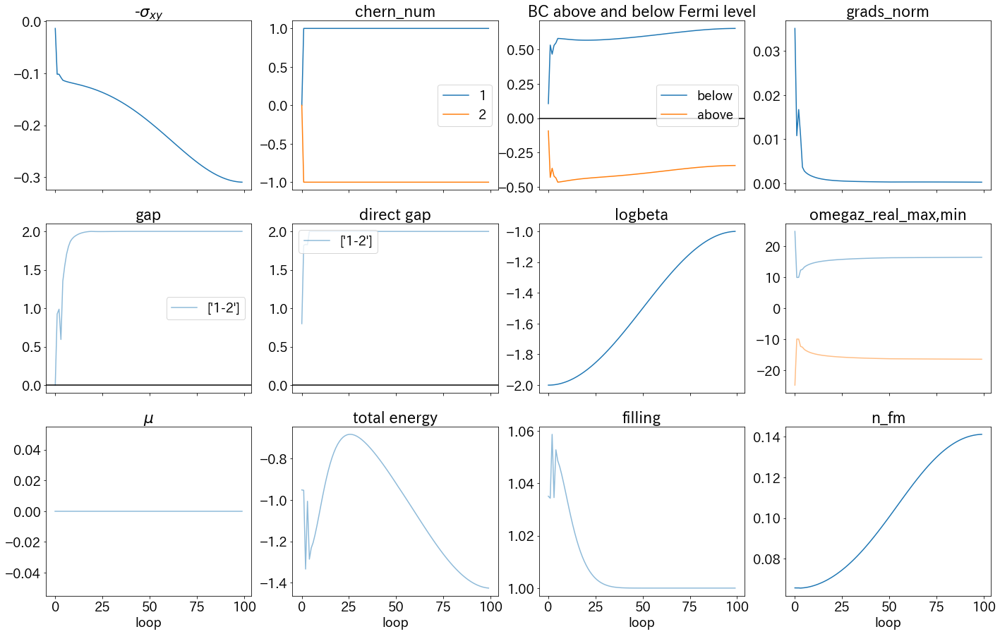

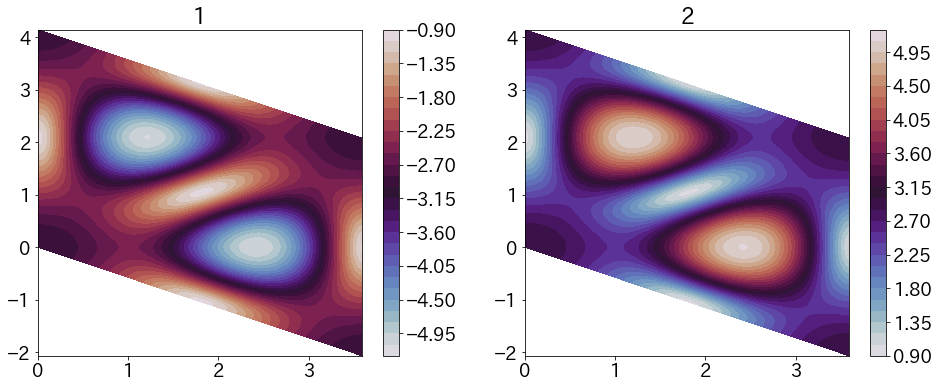

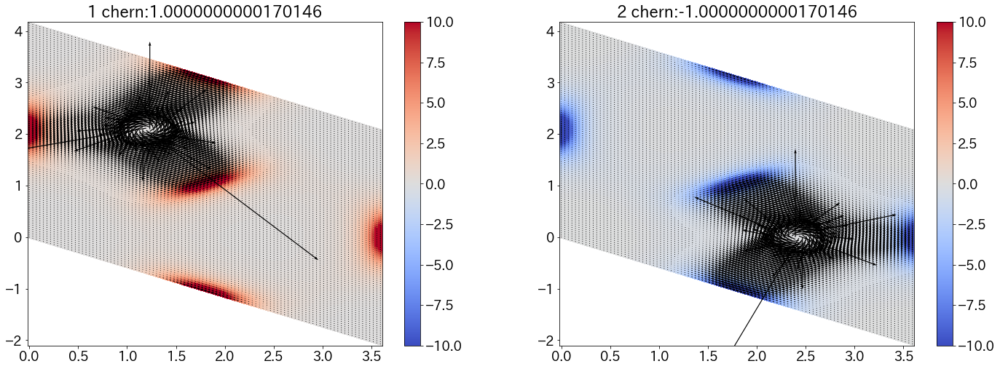

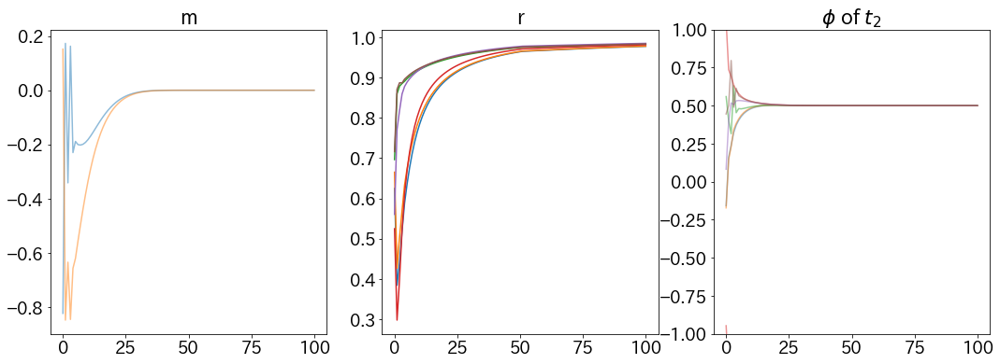

4 1.0000000000157483 [ 1. -1.] 1.0
if you want to load this: 
opt_state, logger = load_results('haldane',4) 
params = get_params(opt_state)



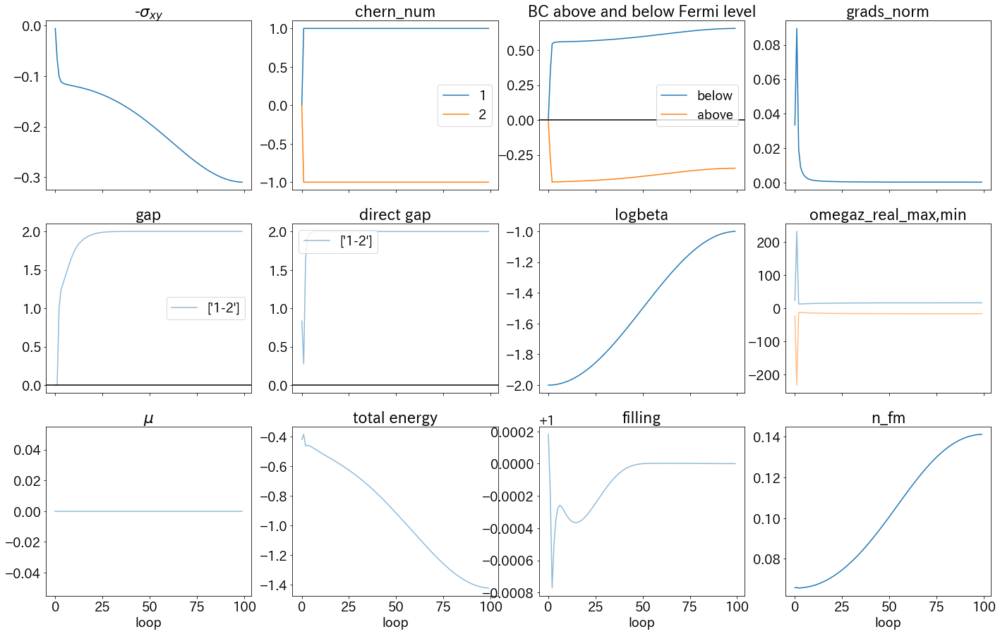

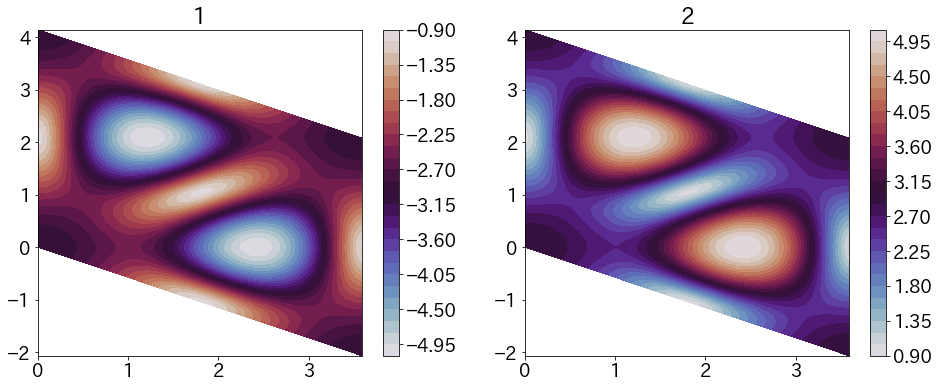

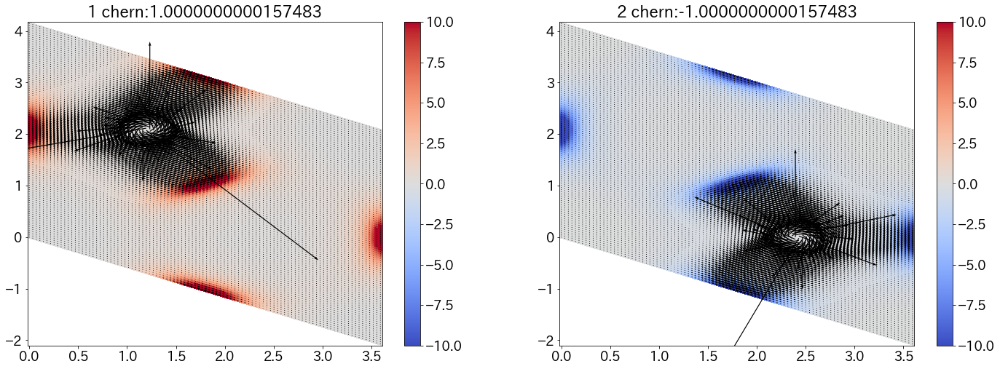

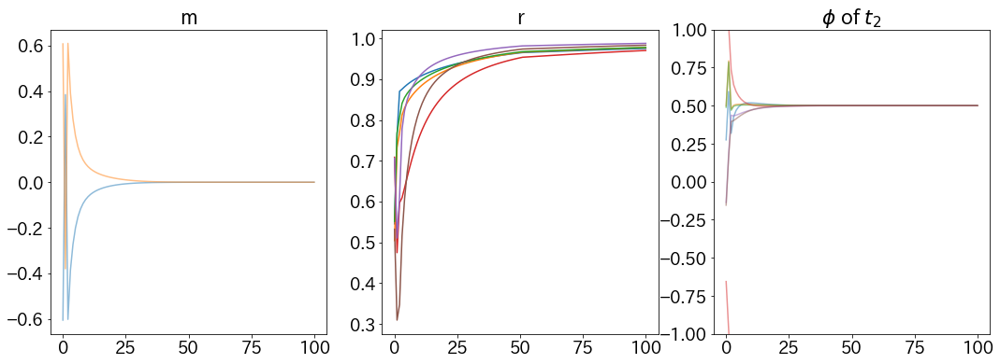

5 1.0000000000136036 [ 1. -1.] 1.0
if you want to load this: 
opt_state, logger = load_results('haldane',5) 
params = get_params(opt_state)



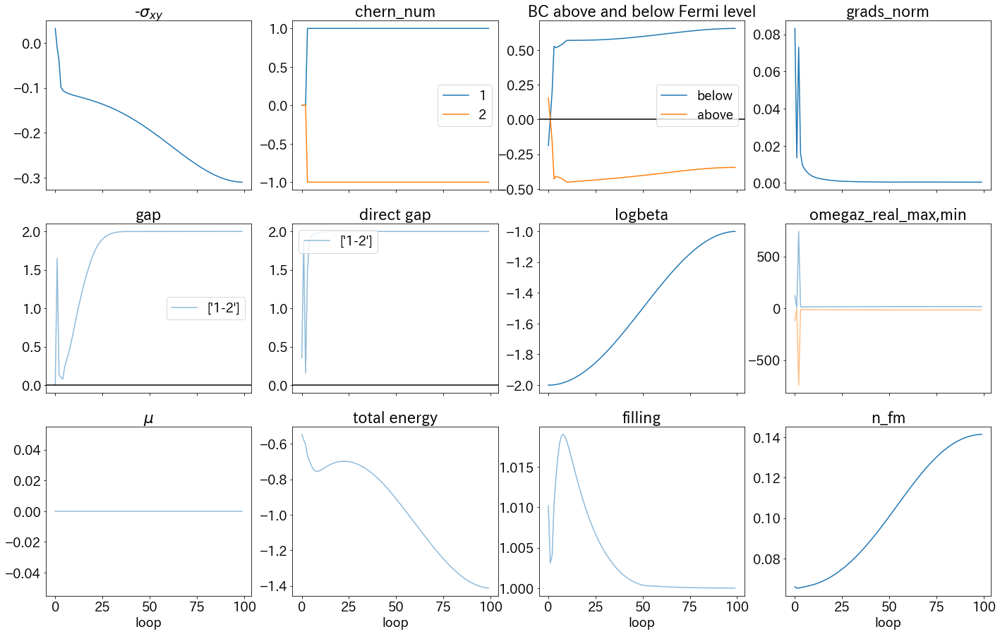

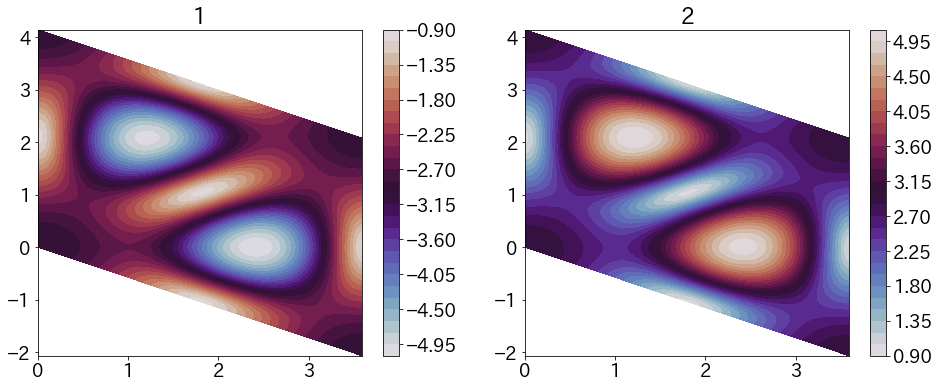

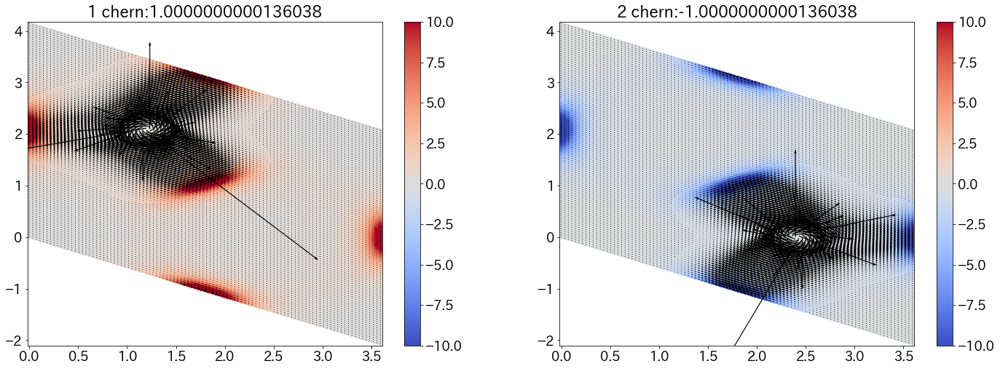

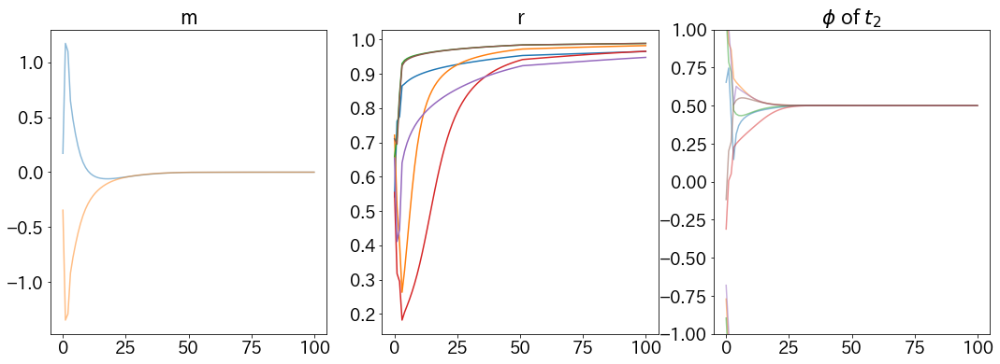

6 1.000000000012524 [ 1. -1.] 1.0
if you want to load this: 
opt_state, logger = load_results('haldane',6) 
params = get_params(opt_state)



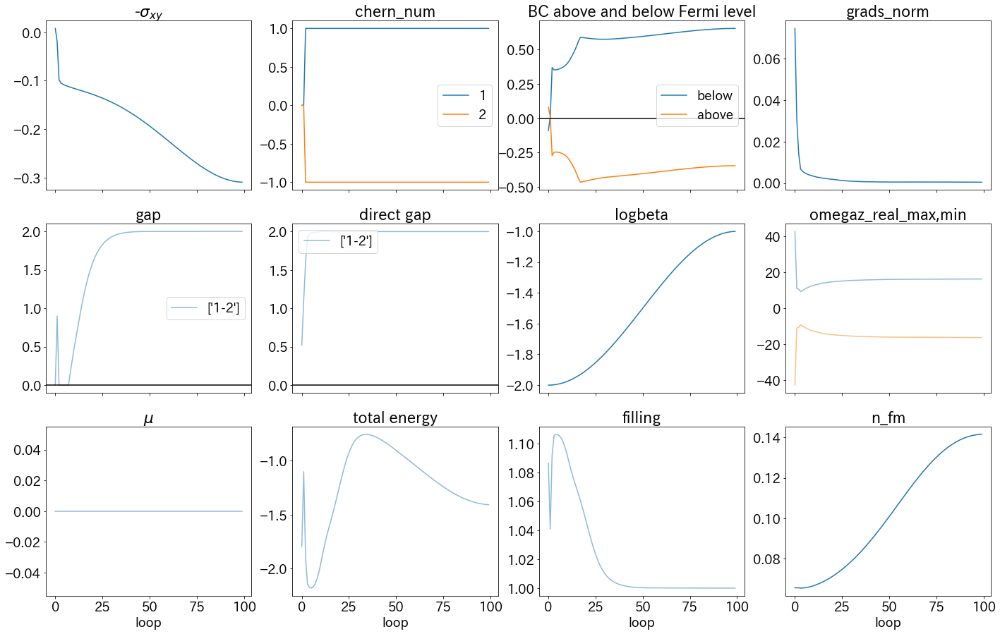

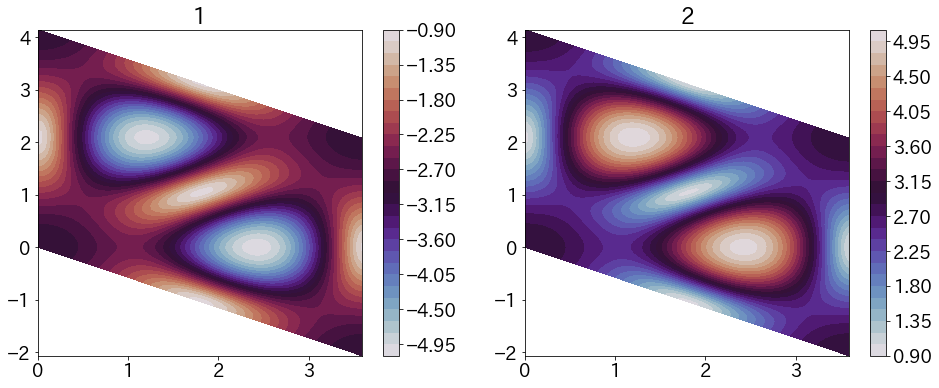

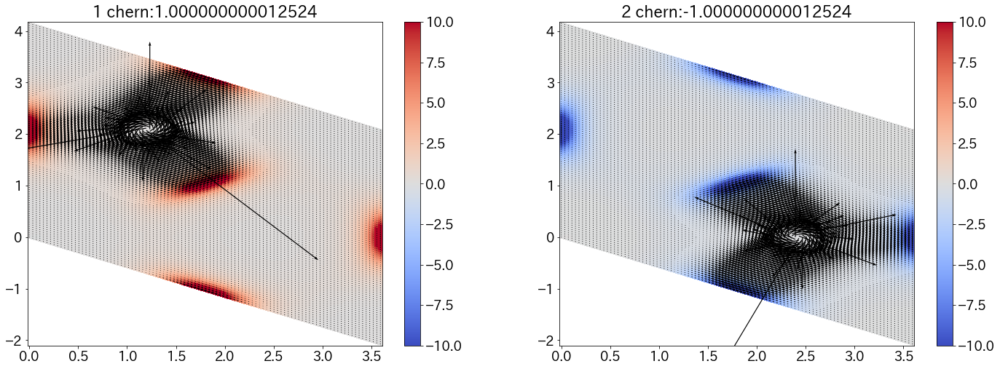

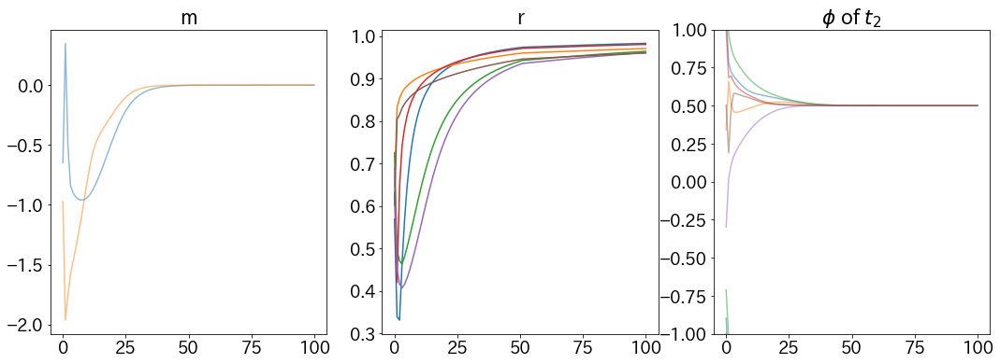

7 1.0000000000163112 [ 1. -1.] 1.0
if you want to load this: 
opt_state, logger = load_results('haldane',7) 
params = get_params(opt_state)



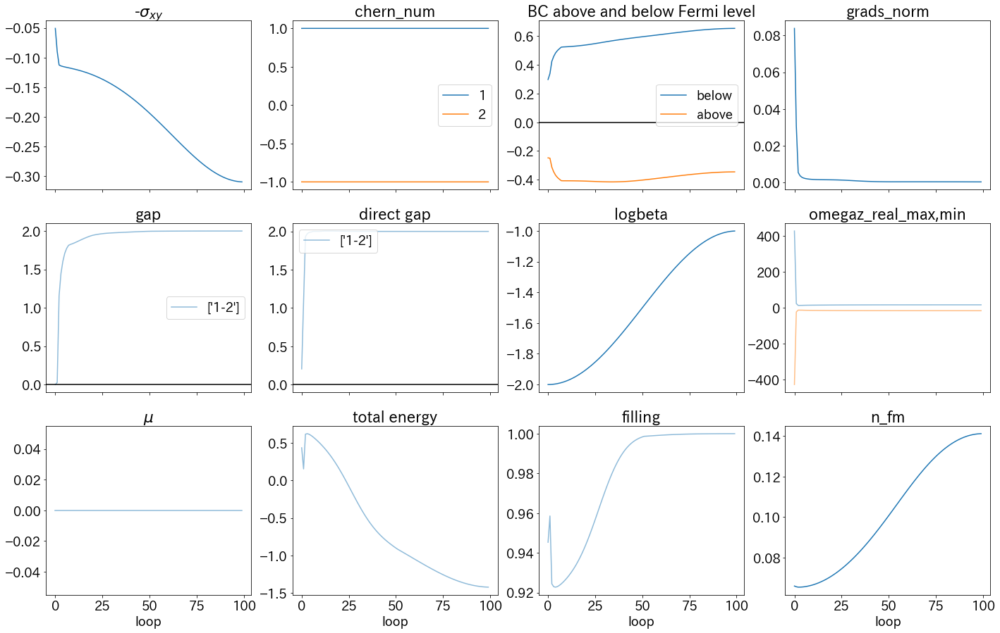

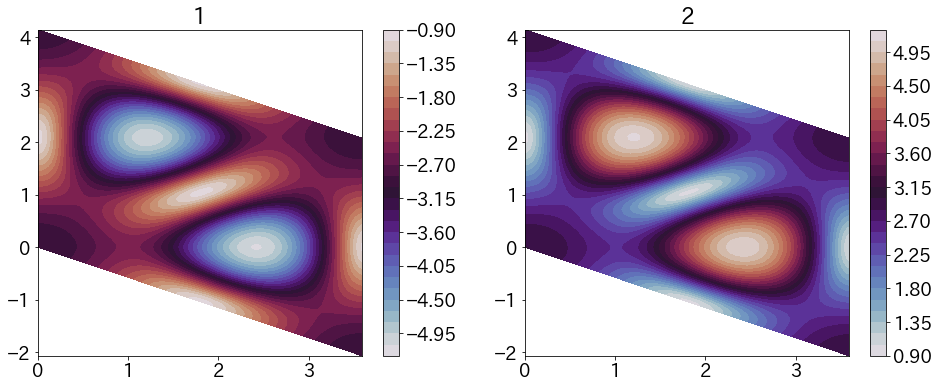

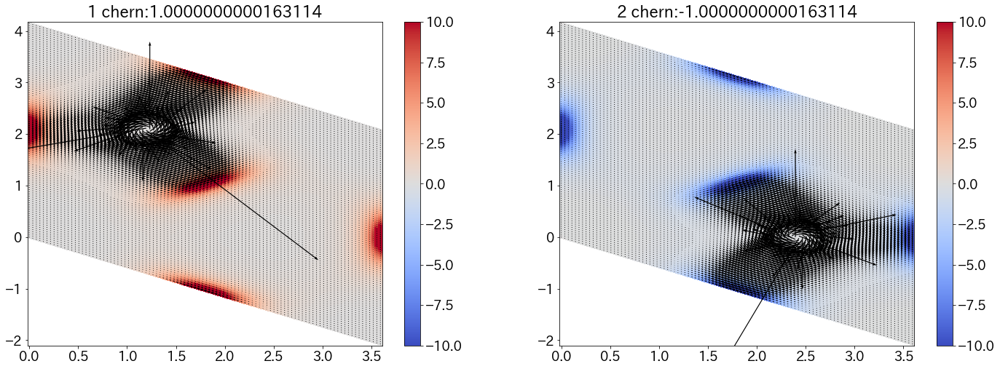

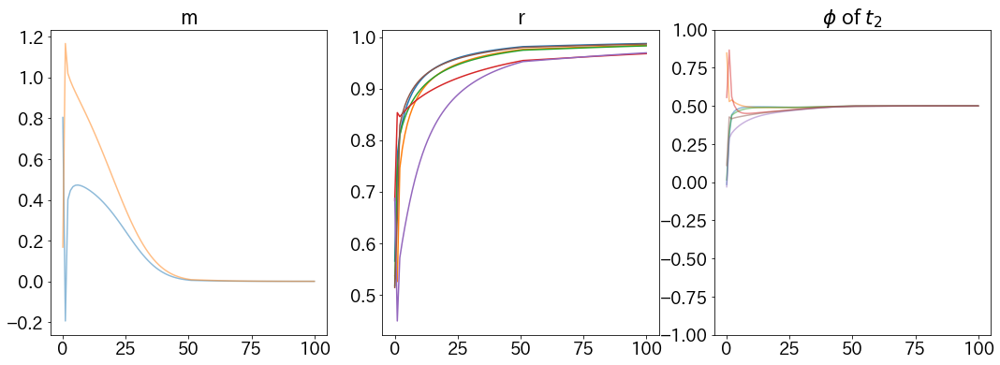

8 1.0000000000045977 [ 1. -1.] 1.0
if you want to load this: 
opt_state, logger = load_results('haldane',8) 
params = get_params(opt_state)



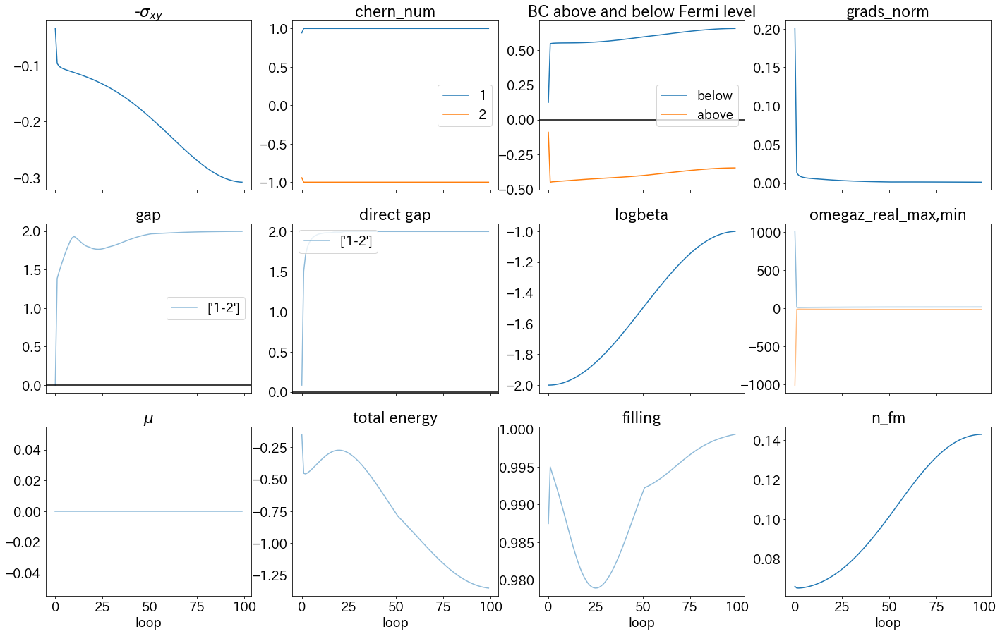

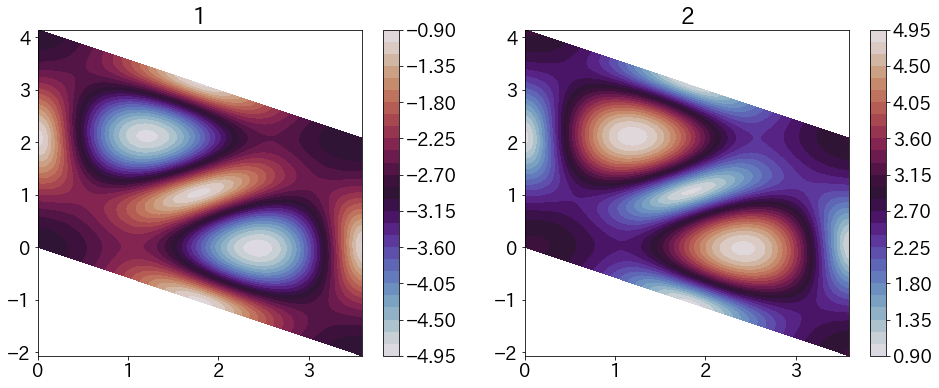

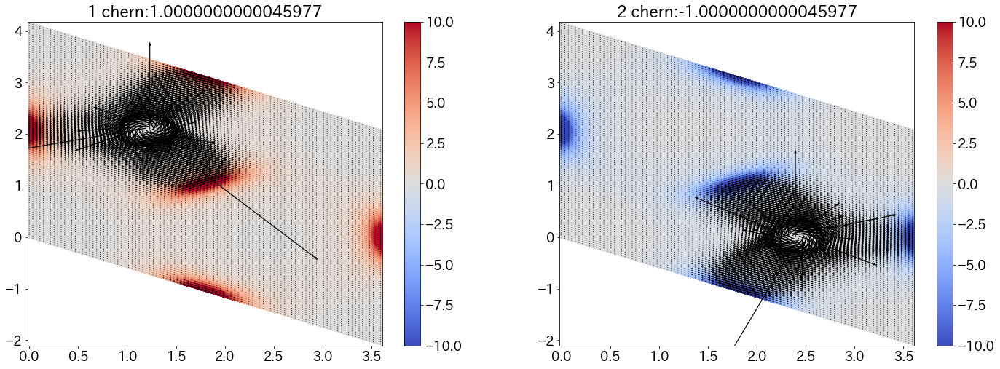

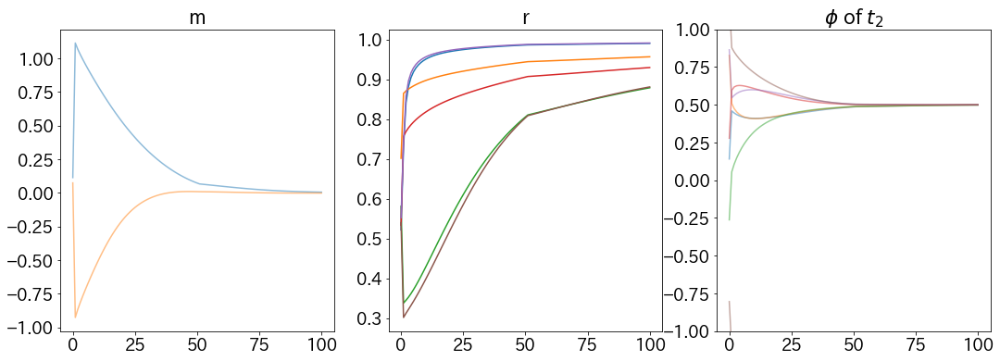

9 1.0000000000103038 [ 1. -1.] 1.0
if you want to load this: 
opt_state, logger = load_results('haldane',9) 
params = get_params(opt_state)



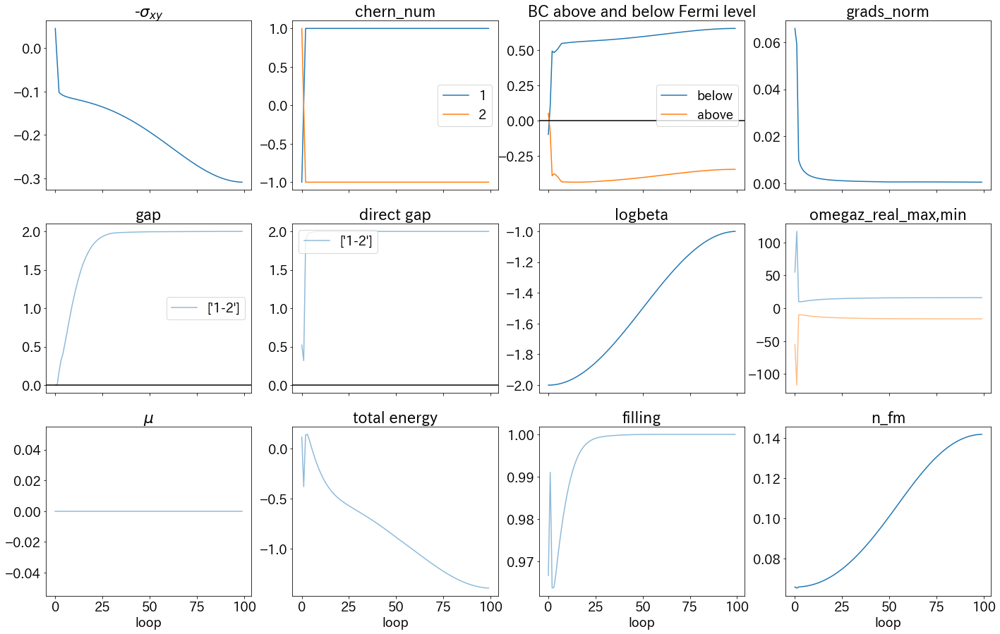

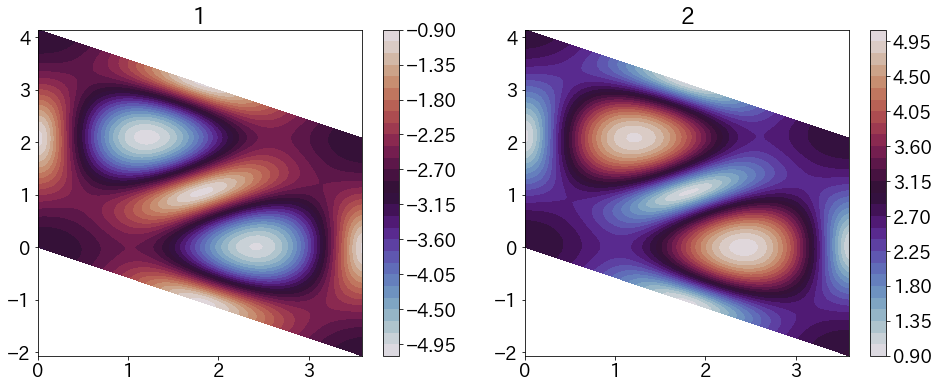

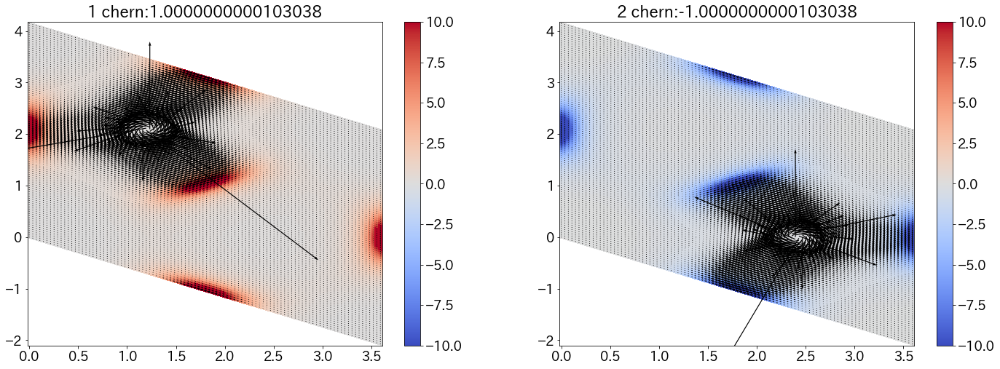

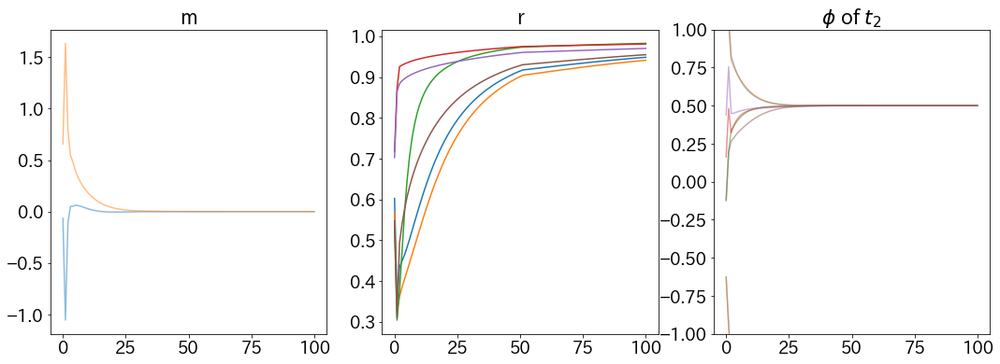

CPU times: user 1min 39s, sys: 2.89 s, total: 1min 42s
Wall time: 1min 28s


In [43]:
%%time
for seed in range(10):
    _,_, get_params = optimizers.rmsprop(0.1, gamma=0.99)
    params_init = get_initial(seed)
    logger = {}
    text_condition = f'haldane'

    step_init = 0 if logger == {} else len(logger['logbeta'])
    xs = {'step': step_init + jnp.arange(num_steps), 'logbeta': logbetas}

    dic_idx_tri = {}
    
    opt_state, logger_tmp = train(xs, params_init, k, from_d, to_d, arrow_d, delta, filling, t_cond, dic_idx_tri, dic_opt)
    
    logger = cat_logger(logger, logger_tmp)
    params = get_params(opt_state)
    
    beta = jnp.array(200)
    delta = jnp.array(0.000000001)
    e,v,sigma_xy, chern_num, n_fill, omegaz, a_x, a_y = calc_result(beta, delta, params, k, from_d, to_d, arrow_d, t_cond, filling=None)
    print(seed, sigma_xy.sum().real/n_k/n_k, chern_num, n_fill)
    save_results(opt_state, logger, text_condition, seed)
    print('')
    
    plot_logger(logger)
    plot_band(k,e)
    plot_berrycurvature(k, omegaz, chern_num, vminmax=10, a_x=a_x, a_y=a_y)
    plot_logger_param(logger, params_init)

# Figure 

In [44]:
def my_color(ii):
    """
    hexade
    base: RGB:79,84,208
    """
    c_h, c_s, c_v = colorsys.rgb_to_hsv(79.0/255, 84.0/255, 208.0/255)
    return colorsys.hsv_to_rgb((c_h+ii*1.0/8)%1.0, c_s, c_v)

In [45]:
import seaborn as sns
sns.set()
sns.set_style("whitegrid", {'grid.linestyle': '-'})
sns.set_context("paper", 2.0, {"lines.linewidth": 3, 'font.size': 9}) # これでフォントが9*2=18になっているはず？ : https://stackoverflow.com/questions/36220829/fine-control-over-the-font-size-in-seaborn-plots-for-academic-papers/36222162

from matplotlib.gridspec import GridSpec, GridSpecFromSubplotSpec

## main

In [46]:
_,_, get_params = optimizers.rmsprop(0.1, gamma=0.99)
opt_state, logger = load_results('haldane',4) 
params = get_params(opt_state)
params_init = get_initial(4)

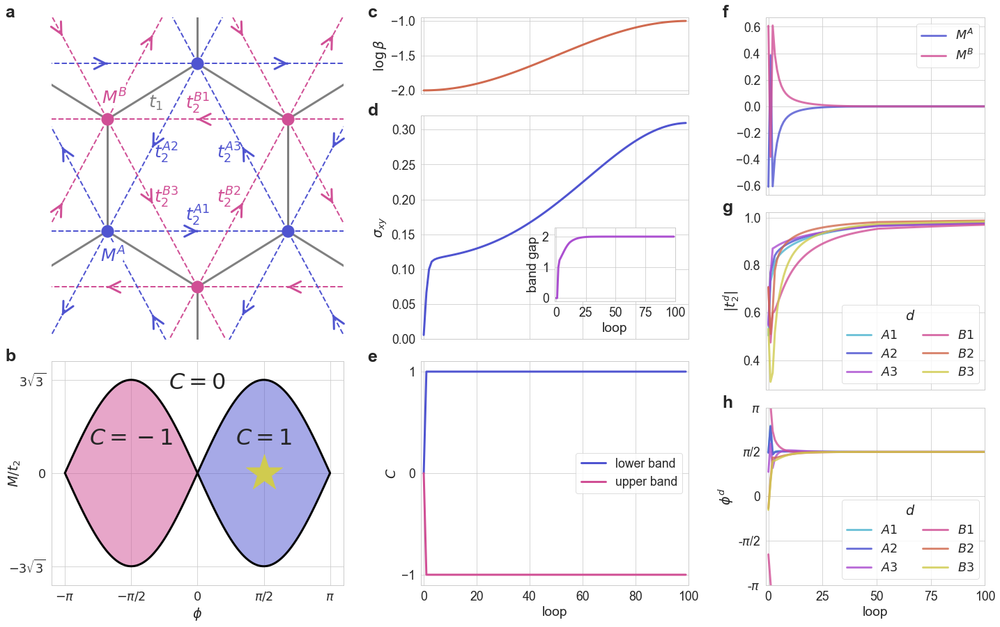

In [49]:
figure = plt.figure(figsize=(24, 15))
gs_master = GridSpec(nrows=12, ncols=3, height_ratios=[1,1,1,1,1,1,1,1,1,1,1,1], width_ratios=[1.2,1.1,0.9], hspace=0.8, wspace=0.3)

_x_fig_ind, _y_fig_ind = -0.20, 0.00

#####################################################################################################
gs_1a = GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs_master[0:2, 1:2], hspace=0.3, wspace=0.3)

ax = figure.add_subplot(gs_1a[0])
ax.plot(logger['logbeta'], color=my_color(3)) # #D0CB4F #4FD08A 
ax.set_ylabel(r'$\log \beta$')
ax.set_xticklabels([])
ax.set_xlim(-1,100)
ax.text(_x_fig_ind, 1+_y_fig_ind*12/2, "c", transform=ax.transAxes, weight='bold', fontsize=25)

#####################################################################################################
gs_1b = GridSpecFromSubplotSpec(nrows=2, ncols=1, subplot_spec=gs_master[2:12, 1:2], hspace=0.1, wspace=0.3)
ax = figure.add_subplot(gs_1b[0])

ax.plot(-logger['sigma_xy'], color=my_color(0), zorder=2)
ax.set_ylim(-0.00, 0.32)
ax.set_xlim(-1,100)
ax.set_xticks([0,20,40,60,80,100])
ax.set_xticklabels([])
ax.set_ylabel(r'$\sigma_{xy}$')
ax.text(_x_fig_ind, 1+_y_fig_ind*12/5, "d", transform=ax.transAxes, weight='bold', fontsize=25)


axin = ax.inset_axes([0.50, 0.17, 0.45, 0.33]) # [left, bottom, width, height]
axin.plot(logger['gaps'], color=my_color(1))
axin.set_ylim(-0.10, 2.3)
axin.set_yticks([0, 1.0, 2.0])
axin.set_xlim(-1,100)
axin.set_xticks([0,25,50,75,100])
axin.set_ylabel(r'band gap')
axin.set_xlabel('loop')




ax = figure.add_subplot(gs_1b[1])

ax.plot(logger['chern_num'][:,0], label='lower band', color='#4F54D0', zorder=1)
ax.plot(logger['chern_num'][:,1], label='upper band', color='#D04F95', zorder=1)
ax.set_ylabel(r'$C$')
ax.legend()
ax.set_yticks([-1,0,1])
ax.text(_x_fig_ind, 1+_y_fig_ind*12/5, "e", transform=ax.transAxes, weight='bold', fontsize=25)



ax.set_xlim(-1,100)
ax.set_xlabel('loop')


#####################################################################################################
gs_1c = GridSpecFromSubplotSpec(nrows=3, ncols=1, subplot_spec=gs_master[0:12, 2:3], hspace=0.1, wspace=0.3)

params = jnp.concatenate([params_init.reshape(1,-1), logger['param']])
ax = figure.add_subplot(gs_1c[0])
ax.plot(params[:, 0], color='#4F54D0', alpha=0.8, label=r'$M^A$')
ax.plot(params[:, 1], color='#D04F95', alpha=0.8, label=r'$M^B$')
ax.set_xlim(-1,100)
ax.legend()
ax.set_xticklabels([])
ax.text(_x_fig_ind, 1+_y_fig_ind, "f", transform=ax.transAxes, weight='bold', fontsize=25)


ax = figure.add_subplot(gs_1c[1])
#cmap = plt.get_cmap("tab10") # ココがポイント
labels = [r'$A1$', r'$A2$',r'$A3$',r'$B1$',r'$B2$',r'$B3$']
for _ind, i in enumerate([1,2,0,3,4,5]):
    ax.plot(jax.nn.sigmoid(params[:, 2+i]), color=my_color(_ind-1), alpha=0.8, label=labels[_ind])
ax.set_ylabel(r'$|t_2^d|$')
ax.legend(ncol=2, loc='lower right', title=r'$d$')
ax.set_xlim(-1,100)
ax.set_xticklabels([])
ax.text(_x_fig_ind, 1+_y_fig_ind, "g", transform=ax.transAxes, weight='bold', fontsize=25)


ax = figure.add_subplot(gs_1c[2])
tmp_phase = params[:, 8:14]* jnp.array([1,-1,1,-1,1,-1])
for _ind, i in enumerate([1,2,0,3,4,5]):
    ax.plot(tmp_phase[:, i], c=my_color(_ind-1), alpha=0.8, label=labels[_ind])
    ax.plot(tmp_phase[:, i]+2*jnp.pi, c=my_color(_ind-1), alpha=0.8, label=None)
    ax.plot(tmp_phase[:, i]-2*jnp.pi, c=my_color(_ind-1), alpha=0.8, label=None)    
ax.set_ylim(-jnp.pi,jnp.pi)
ax.set_ylabel(r'$\phi^d$')
ax.legend(ncol=2, loc='lower right', title=r'$d$')
ax.set_yticks([-np.pi, -np.pi/2, 0.0, np.pi/2, np.pi])
ax.set_yticklabels([r'-$\pi$',r'-$\pi$/2',r'0',r'$\pi$/2',r'$\pi$'])
ax.set_xlim(-1,100)
ax.set_xlabel('loop')
ax.text(_x_fig_ind, 1+_y_fig_ind, "h", transform=ax.transAxes, weight='bold', fontsize=25)


#####################################################################################################
gs_2 = GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs_master[0:7, 0:1], hspace=0.4)
ax = figure.add_subplot(gs_2[:, :])

color_a = '#4F54D0' 
color_b = '#D04F95' 

N_points = 3
tmp1 = np.arange(-N_points,N_points).repeat(2*N_points).reshape(-1,1)
tmp2 = np.arange(-N_points,N_points).repeat(2*N_points).reshape(2*N_points,2*N_points).T.reshape(-1,1)
points_A = tmp1*R[0] + tmp2*R[1]

for i in range(2*N_points*2*N_points):
    _x,_y = points_A[i][0], points_A[i][1]    
    ax.plot([_x, _x+a[0][0]], [_y, _y+a[0][1]], c='gray', zorder=1)
    ax.plot([_x, _x+a[1][0]], [_y, _y+a[1][1]], c='gray', zorder=1)
    ax.plot([_x, _x+a[2][0]], [_y, _y+a[2][1]], c='gray', zorder=1)
    ax.plot([_x, _x+da2[0][0]], [_y, _y+da2[0][1]], c=color_a, zorder=1,  linestyle = "dashed", lw=2)
    ax.plot([_x, _x+da2[1][0]], [_y, _y+da2[1][1]], c=color_a, zorder=1,  linestyle = "dashed", lw=2)
    ax.plot([_x, _x+da2[2][0]], [_y, _y+da2[2][1]], c=color_a, zorder=1,  linestyle = "dashed", lw=2)
    ax.plot([_x+a[0][0], _x+da2[0][0]+a[0][0]], [_y+a[0][1], _y+da2[0][1]+a[0][1]], c=color_b, zorder=1,  linestyle = "dashed", lw=2)
    ax.plot([_x+a[0][0], _x+da2[1][0]+a[0][0]], [_y+a[0][1], _y+da2[1][1]+a[0][1]], c=color_b, zorder=1,  linestyle = "dashed", lw=2)
    ax.plot([_x+a[0][0], _x+da2[2][0]+a[0][0]], [_y+a[0][1], _y+da2[2][1]+a[0][1]], c=color_b, zorder=1,  linestyle = "dashed", lw=2)

    ax.annotate('', xytext=(_x+da2[0][0]*0.49, _y+da2[0][1]*0.49), xy=(_x+da2[0][0]*0.51, _y+da2[0][1]*0.51), 
                arrowprops=dict(arrowstyle="->", color=color_a, lw=3), zorder=1, size=40)
    ax.annotate('', xytext=(_x+da2[1][0]*0.51, _y+da2[1][1]*0.51), xy=(_x+da2[1][0]*0.49, _y+da2[1][1]*0.49), 
                arrowprops=dict(arrowstyle="->", color=color_a, lw=3), zorder=1, size=40)
    ax.annotate('', xytext=(_x+da2[2][0]*0.49, _y+da2[2][1]*0.49), xy=(_x+da2[2][0]*0.51, _y+da2[2][1]*0.51), 
                arrowprops=dict(arrowstyle="->", color=color_a, lw=3), zorder=1, size=40)
    
    ax.annotate('', xytext=(_x+a[0][0]+da2[0][0]*0.51, _y+a[0][1]+da2[0][1]*0.51), xy=(_x+a[0][0]+da2[0][0]*0.49, _y+a[0][1]+da2[0][1]*0.49), 
                arrowprops=dict(arrowstyle="->", color=color_b, lw=3), zorder=1, size=40)
    ax.annotate('', xytext=(_x+a[0][0]+da2[1][0]*0.49, _y+a[0][1]+da2[1][1]*0.49), xy=(_x+a[0][0]+da2[1][0]*0.51, _y+a[0][1]+da2[1][1]*0.51), 
                arrowprops=dict(arrowstyle="->", color=color_b, lw=3), zorder=1, size=40)
    ax.annotate('', xytext=(_x+a[0][0]+da2[2][0]*0.51, _y+a[0][1]+da2[2][1]*0.51), xy=(_x+a[0][0]+da2[2][0]*0.49, _y+a[0][1]+da2[2][1]*0.49), 
                arrowprops=dict(arrowstyle="->", color=color_b, lw=3), zorder=1, size=40)

ax.text(-0.81, -1.72, r'$M^A$', horizontalalignment='center', verticalalignment='center', fontsize=25, color=color_a, zorder=4)
r = pat.Rectangle(xy=(-0.8-0.08, -1.68-0.08), width=0.16, height=0.16, fc='white', ec='white', zorder=3)
ax.add_patch(r)

ax.text( 0.0, -1.36, r'$t_2^{A1}$', horizontalalignment='center', verticalalignment='center', fontsize=25, color=color_a)
ax.text(-0.3, -0.80, r'$t_2^{A2}$', horizontalalignment='center', verticalalignment='center', fontsize=25, color=color_a)
ax.text( 0.3, -0.80, r'$t_2^{A3}$', horizontalalignment='center', verticalalignment='center', fontsize=25, color=color_a)

ax.text(-0.8, -0.31, r'$M^B$', horizontalalignment='center', verticalalignment='center', fontsize=25, color=color_b, zorder=4)
r = pat.Rectangle(xy=(-0.8-0.08, -0.30-0.08), width=0.19, height=0.20, fc='white', ec='white', zorder=3)
ax.add_patch(r)

ax.text( 0.0, -0.36, r'$t_2^{B1}$', horizontalalignment='center', verticalalignment='center', fontsize=25, color=color_b)
ax.text( 0.3, -1.20, r'$t_2^{B2}$', horizontalalignment='center', verticalalignment='center', fontsize=25, color=color_b)
ax.text(-0.3, -1.20, r'$t_2^{B3}$', horizontalalignment='center', verticalalignment='center', fontsize=25, color=color_b)

ax.text(-0.40, -0.35, r'$t_1$', horizontalalignment='center', verticalalignment='center', fontsize=25, color='gray')

ax.text(-0.16, 1.00, "a", transform=ax.transAxes, weight='bold', fontsize=25)

ax.scatter(points_A[:,0], points_A[:,1], s=300, zorder=2, color=color_a)
ax.scatter(points_A[:,0]+a[1,0], points_A[:,1]+a[1,1], s=300, zorder=2, color=color_b)

ax.set_yticks([-2.0,-1.5,-1.0,-0.5,0.0])
ax.set_yticklabels([-1.0,-0.5,0.0,0.5,1.0])

tmp_mul = 24*1.2/3.2/(15*7/12)
ax.set_xlim(-1.4,1.4)
ax.set_ylim(-2.4*tmp_mul,0.4*tmp_mul)


ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
ax.grid(False)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)



#####################################################################################################
gs_3 = GridSpecFromSubplotSpec(nrows=1, ncols=1, subplot_spec=gs_master[7:12, 0:1], hspace=0.4)
ax = figure.add_subplot(gs_3[:, :])
_phi1 = np.linspace(-np.pi, 0, 100)
_phi2 = np.linspace(0, np.pi, 100)
boundary11 =  3*np.sqrt(3.0)*np.sin(_phi1)
boundary12 = -3*np.sqrt(3.0)*np.sin(_phi1)
boundary21 =  3*np.sqrt(3.0)*np.sin(_phi2)
boundary22 = -3*np.sqrt(3.0)*np.sin(_phi2)
ax.plot(_phi1, boundary11, c='black', lw=3)
ax.plot(_phi1, boundary12, c='black', lw=3)
ax.plot(_phi2, boundary21, c='black', lw=3)
ax.plot(_phi2, boundary22, c='black', lw=3)

ax.fill_between(_phi2, boundary21, boundary22, alpha=0.5, color='#4F54D0')
ax.fill_between(_phi1, boundary11, boundary12, alpha=0.5, color='#D04F95')

ax.scatter(np.pi/2, 0, marker='*', s=3000, color=my_color(4))

ax.text(np.pi/2, 1.9, r'$C=1$', horizontalalignment='center', verticalalignment='center', fontsize=32)
ax.text(-np.pi/2, 1.9, r'$C=-1$', horizontalalignment='center', verticalalignment='center', fontsize=32)
ax.text(0, 5.0, r'$C=0$', horizontalalignment='center', verticalalignment='center', fontsize=32)

ax.text(-0.16, 1.00, "b", transform=ax.transAxes, weight='bold', fontsize=25)

ax.set_xlabel(r'$\phi$')
ax.set_ylabel(r'$M/t_2$',labelpad=-20)

ax.set_xlim(-np.pi*1.1, np.pi*1.1)
ax.set_ylim(-3*np.sqrt(3)*1.2, 3*np.sqrt(3)*1.2)
ax.set_xticks([-np.pi, -np.pi/2, 0.0, np.pi/2, np.pi])
ax.set_xticklabels([r'$-\pi$', r'$-\pi/2$', r'$0$',r'$\pi/2$',r'$\pi$'])
ax.set_yticks([-3*np.sqrt(3), 0.0, 3*np.sqrt(3)])
ax.set_yticklabels([r'$-3\sqrt{3}$', r'$0$',r'$3\sqrt{3}$'])

figure.savefig("figure/haldane.pdf", format='pdf')
plt.show()

## supplimentary 

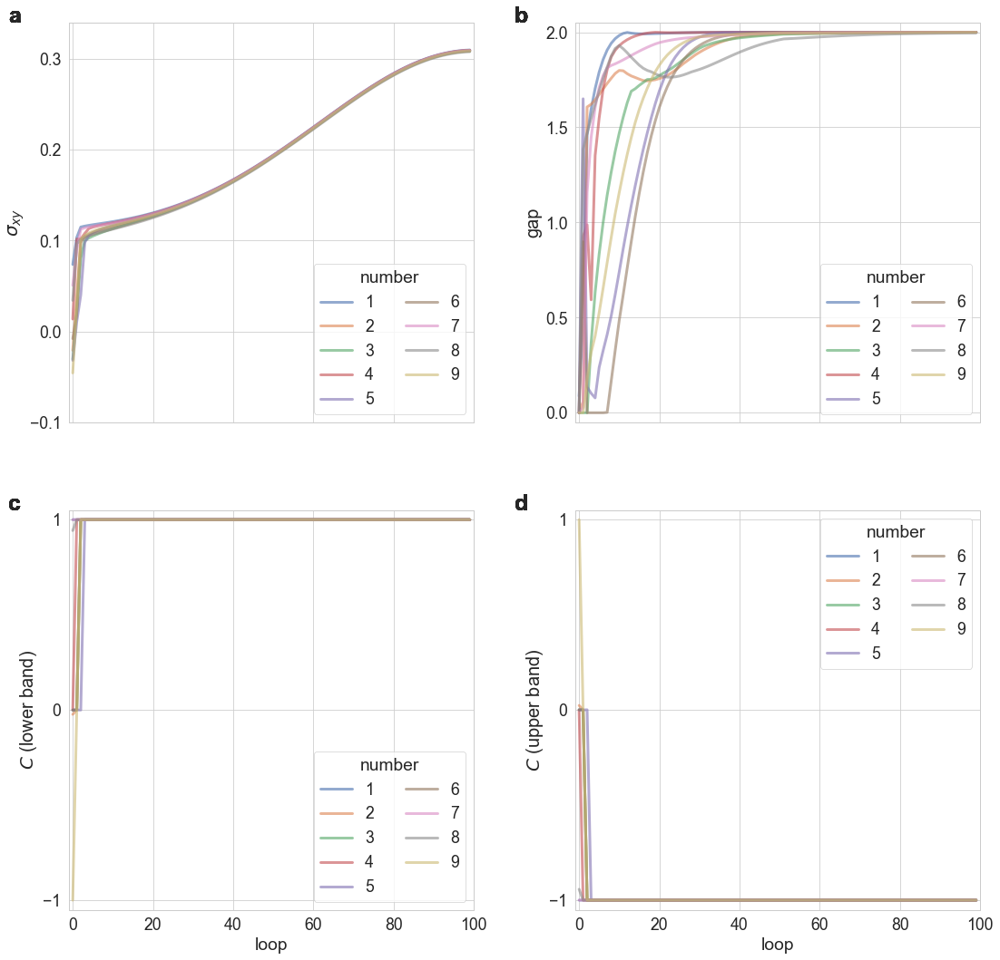

In [51]:
fig, axes = plt.subplots(2,2, figsize=(18,18), sharex=True)
fig.subplots_adjust(hspace=0.22, wspace = 0.25)

title_legend = 'number'

ax = axes[0,0]
for _ind_seed, seed in enumerate([0,1,2,3,5,6,7,8,9]):
    opt_state, logger = load_results('haldane',seed) 
    ax.plot(-logger['sigma_xy'], alpha=0.6, label=f'{_ind_seed+1}')
    ax.set_ylim(-0.10, 0.34)
    ax.set_yticks([-0.1, 0, 0.1,0.2, 0.3])
    ax.set_ylabel(r'$\sigma_{xy}$', fontsize=20)
    ax.legend(ncol=2, loc='lower right', title=title_legend)
    ax.text(-0.15, 1.00, "a", transform=ax.transAxes, weight='bold', fontsize=25)

    
ax = axes[0,1]
for _ind_seed, seed in enumerate([0,1,2,3,5,6,7,8,9]):
    opt_state, logger = load_results('haldane',seed) 
    ax.plot(logger['gaps'], alpha=0.6, label=f'{_ind_seed+1}')
    ax.set_ylim(-0.05, 2.05)
    ax.set_yticks([0,0.5,1.0,1.5,2.0])
    ax.set_ylabel('gap', fontsize=20)
    ax.legend(ncol=2, loc='lower right', title=title_legend)
    ax.text(-0.15, 1.00, "b", transform=ax.transAxes, weight='bold', fontsize=25)


ax = axes[1,0]
for _ind_seed, seed in enumerate([0,1,2,3,5,6,7,8,9]):
    opt_state, logger = load_results('haldane',seed) 
    ax.plot(logger['chern_num'][:,0], alpha=0.6, label=f'{_ind_seed+1}')
    ax.set_xlim(-1,100)
    ax.set_ylim(-1.05, 1.05)
    ax.set_yticks([-1,0,1])
    ax.set_xlabel('loop')
    ax.set_ylabel(r'$C$ (lower band)', fontsize=20)
    ax.legend(ncol=2, loc='lower right', title=title_legend)
    ax.text(-0.15, 1.00, "c", transform=ax.transAxes, weight='bold', fontsize=25)


ax = axes[1,1]
for _ind_seed, seed in enumerate([0,1,2,3,5,6,7,8,9]):
    opt_state, logger = load_results('haldane',seed) 
    ax.plot(logger['chern_num'][:,1], alpha=0.6, label=f'{_ind_seed+1}')
    ax.set_xlim(-1,100)
    ax.set_xlabel('loop')
    ax.set_ylim(-1.05, 1.05)
    ax.set_yticks([-1,0,1])
    ax.set_ylabel(r'$C$ (upper band)', fontsize=20)
    ax.legend(ncol=2, loc='upper right', title=title_legend)
    ax.text(-0.15, 1.00, "d", transform=ax.transAxes, weight='bold', fontsize=25)

fig.savefig("figure/sup_haldane.pdf", format='pdf')
plt.show()

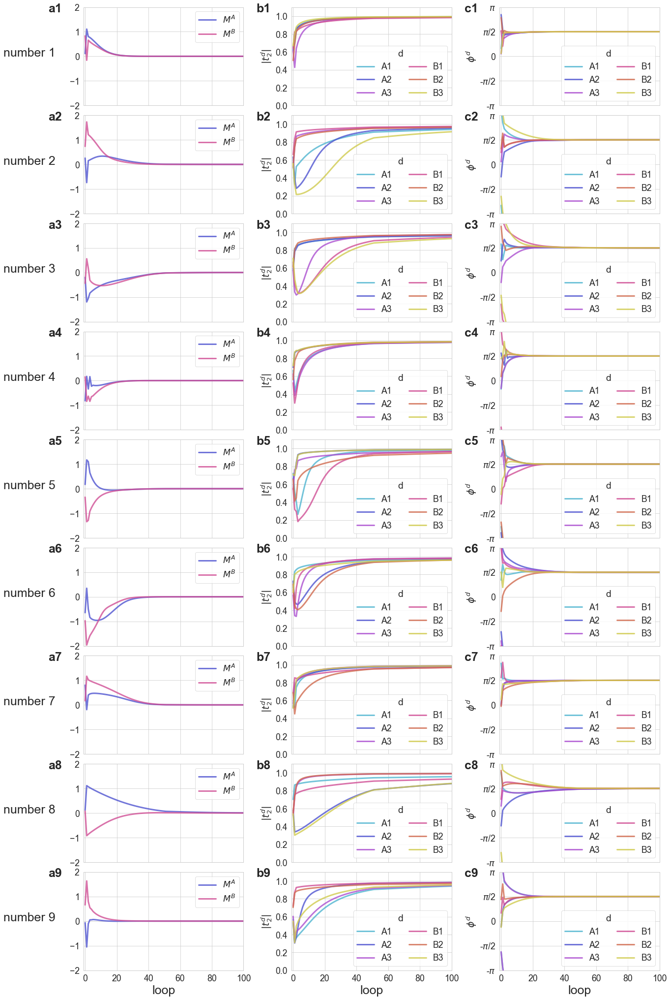

In [52]:
fig, axes = plt.subplots(9,3, figsize=(21,36), sharex=True)
fig.subplots_adjust(hspace=0.1, wspace = 0.30)

_,_, get_params = optimizers.rmsprop(0.1, gamma=0.99)
cmap = plt.get_cmap("tab10") # ココがポイント

_prefix = 'number'
_fsize = 25

for _ind_seed, seed in enumerate([0,1,2,3,5,6,7,8,9]):
    opt_state, logger = load_results('haldane',seed) 
    params_init = get_initial(seed)
    params = jnp.concatenate([params_init.reshape(1,-1), logger['param']])
    
    
    ax = axes[_ind_seed,0]
    ax.plot(params[:, 0], color='#4F54D0', alpha=0.8, label=r'$M^A$')
    ax.plot(params[:, 1], color='#D04F95', alpha=0.8, label=r'$M^B$')
    ax.set_xlim(-1,100)
    ax.set_ylim(-2,2)
    ax.set_yticks([-2,-1,0,1,2])
    ax.legend()
    ax.text(-0.22, 0.95, f"a{_ind_seed+1}", transform=ax.transAxes, weight='bold', fontsize=_fsize)
    ax.text(-0.50, 0.50, f"{_prefix} {_ind_seed+1}", transform=ax.transAxes, fontsize=_fsize)

    if _ind_seed == 8:
        ax.set_xlabel('loop', fontsize=_fsize)



    ax = axes[_ind_seed,1]
    labels = ['A1', 'A2','A3','B1','B2','B3']
    for _ind, i in enumerate([1,2,0,3,4,5]):
        ax.plot(jax.nn.sigmoid(params[:, 2+i]), color=my_color(_ind-1), alpha=0.8, label=labels[_ind])
    ax.set_ylabel(r'$|t_2^d|$')
    ax.legend(ncol=2, loc='lower right', title='d')
    ax.set_xlim(-1,100)
    ax.set_ylim(0,1.1)
    ax.set_yticks([0,0.2,0.4,0.6,0.8,1.0])
    ax.text(-0.22, 0.95, f"b{_ind_seed+1}", transform=ax.transAxes, weight='bold', fontsize=_fsize)
    if _ind_seed == 8:
        ax.set_xlabel('loop', fontsize=_fsize)


    
    ax = axes[_ind_seed,2]
    tmp_phase = params[:, 8:14]* jnp.array([1,-1,1,-1,1,-1])
    for _ind, i in enumerate([1,2,0,3,4,5]):
        ax.plot(tmp_phase[:, i], c=my_color(_ind-1), alpha=0.8, label=labels[_ind])
        ax.plot(tmp_phase[:, i]+2*jnp.pi, c=my_color(_ind-1), alpha=0.8, label=None)
        ax.plot(tmp_phase[:, i]-2*jnp.pi, c=my_color(_ind-1), alpha=0.8, label=None)    
    ax.set_ylim(-jnp.pi,jnp.pi)
    ax.set_ylabel(r'$\phi^d$')
    ax.legend(ncol=2, loc='lower right', title='d')
    ax.set_yticks([-np.pi, -np.pi/2, 0.0, np.pi/2, np.pi])
    ax.set_yticklabels([r'-$\pi$',r'-$\pi$/2',r'0',r'$\pi$/2',r'$\pi$'])
    ax.set_xlim(-1,100)
    ax.text(-0.22, 0.95, f"c{_ind_seed+1}", transform=ax.transAxes, weight='bold', fontsize=_fsize)
    if _ind_seed == 8:
        ax.set_xlabel('loop', fontsize=_fsize)
        
fig.savefig("figure/sup_haldane_param.pdf", format='pdf')
plt.show()
